# DataSet explanation:

## The columns:
**For Generation Data**:

DATE_TIME:  Date and time for each observation. Observations recorded at 15 minute intervals.

PLANT_ID : ID of Solar Power Plant

SOURCE_KEY: Inverter ID

DC_POWER: power input to the inverter (SOURCE_KEY) at interval (in kW)

AC_POWER: power generated by the inverter (SOURCE_KEY) at interval (in kW)

DAILY_YIELD:shows how much energy has been generated so far on a given day

This is the cumulative sum of the energy generated since the start of the current day (midnight).
It resets to zero at the beginning of each day and accumulates throughout the day for each 15-minute interval.


TOTAL_YIELD:reflects the lifetime energy generation of the inverter up to the recorded timestamp.

This is the overall cumulative energy generated by the inverter (represented by SOURCE_KEY) from the time it started operating until the current observation time.
It keeps increasing across days and does not reset, unless the system is reset or reinitialized.







**For Weather Sensor Data**
DATE_TIME:  Date and time for each observation. Observations recorded at 15 minute intervals

PLANT_ID: ID of Solar Power Plant (common for the entire file)

SOURCE_KEY: Sensor panel ID (Common for entire file, only one type of sensor panel for the plant)

AMBIENT_TEMPERATURE: The air temperature surrounding the solar plant.
Useful for analyzing how external temperature impacts power generation and inverter performance.


MODULE_TEMPERATURE: The temperature of the module attached to the sensor panel.


IRRADIATION: Amount of irradiation for the 15 minute interval


# import libraries and Dataset

In [328]:
import pandas as pd
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import cross_validate
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
!pip install tpot
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
from tpot import TPOTRegressor
from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor, early_stopping
from catboost import CatBoostRegressor, Pool
from lightgbm import LGBMRegressor, early_stopping
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError


warnings.filterwarnings("ignore")

In [ ]:
generation_data2= pd.read_csv('Plant_2_Generation_Data.csv')

In [ ]:
weather_data2= pd.read_csv('Plant_2_Weather_Sensor_Data.csv')

# EDA for generation_data2

In [ ]:
generation_data2.head(5)

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09
3,2020-05-15 00:00:00,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06
4,2020-05-15 00:00:00,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07


In [ ]:
generation_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    67698 non-null  object 
 1   PLANT_ID     67698 non-null  int64  
 2   SOURCE_KEY   67698 non-null  object 
 3   DC_POWER     67698 non-null  float64
 4   AC_POWER     67698 non-null  float64
 5   DAILY_YIELD  67698 non-null  float64
 6   TOTAL_YIELD  67698 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.6+ MB


In [ ]:
generation_data2.isnull().sum()

,0
DATE_TIME,0
PLANT_ID,0
SOURCE_KEY,0
DC_POWER,0
AC_POWER,0
DAILY_YIELD,0
TOTAL_YIELD,0


In [ ]:
generation_data2.describe()

,PLANT_ID,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
count,67698.0,67698.000000,67698.000000,67698.000000,6.769800e+04
mean,4136001.0,246.701961,241.277825,3294.890295,6.589448e+08
std,0.0,370.569597,362.112118,2919.448386,7.296678e+08
min,4136001.0,0.000000,0.000000,0.000000,0.000000e+00
25%,4136001.0,0.000000,0.000000,272.750000,1.996494e+07
50%,4136001.0,0.000000,0.000000,2911.000000,2.826276e+08
75%,4136001.0,446.591667,438.215000,5534.000000,1.348495e+09
max,4136001.0,1420.933333,1385.420000,9873.000000,2.247916e+09


In [ ]:
generation_data2['SOURCE_KEY'].nunique()

22

In [ ]:
generation_data2['PLANT_ID'].nunique()

1

In [ ]:
generation_data2['DATE_TIME'] = pd.to_datetime(generation_data2['DATE_TIME'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
generation_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   DATE_TIME    67698 non-null  datetime64[ns]
 1   PLANT_ID     67698 non-null  int64         
 2   SOURCE_KEY   67698 non-null  object        
 3   DC_POWER     67698 non-null  float64       
 4   AC_POWER     67698 non-null  float64       
 5   DAILY_YIELD  67698 non-null  float64       
 6   TOTAL_YIELD  67698 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 3.6+ MB


In [ ]:
generation_data2.duplicated().sum()

0

# EDA Weather Sensor datasets2

In [ ]:
weather_data2.head(5)

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4136001,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,4136001,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,4136001,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,4136001,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,4136001,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0


In [ ]:
weather_data2['SOURCE_KEY'].nunique()

1

In [ ]:
weather_data2['PLANT_ID'].nunique()

1

In [ ]:
weather_data2.duplicated().sum()

0

In [ ]:
weather_data2['DATE_TIME'] = pd.to_datetime(weather_data2['DATE_TIME'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
weather_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259 entries, 0 to 3258
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   DATE_TIME            3259 non-null   datetime64[ns]
 1   PLANT_ID             3259 non-null   int64         
 2   SOURCE_KEY           3259 non-null   object        
 3   AMBIENT_TEMPERATURE  3259 non-null   float64       
 4   MODULE_TEMPERATURE   3259 non-null   float64       
 5   IRRADIATION          3259 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(1)
memory usage: 152.9+ KB


In [ ]:
weather_data2['SOURCE_KEY'].nunique()

1

# Merging generation data2 and weather sensor data2

In [ ]:
solar = pd.merge(generation_data2.drop(columns = ['PLANT_ID']), weather_data2.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')
solar


,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0
1,2020-05-15 00:00:00,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0
2,2020-05-15 00:00:00,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0
3,2020-05-15 00:00:00,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0
4,2020-05-15 00:00:00,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0
...,...,...,...,...,...,...,...,...,...
67693,2020-06-17 23:45:00,q49J1IKaHRwDQnt,0.0,0.0,4157.000000,5.207580e+05,23.202871,22.535908,0.0
67694,2020-06-17 23:45:00,rrq4fwE8jgrTyWY,0.0,0.0,3931.000000,1.211314e+08,23.202871,22.535908,0.0
67695,2020-06-17 23:45:00,vOuJvMaM2sgwLmb,0.0,0.0,4322.000000,2.427691e+06,23.202871,22.535908,0.0
67696,2020-06-17 23:45:00,xMbIugepa2P7lBB,0.0,0.0,4218.000000,1.068964e+08,23.202871,22.535908,0.0


# EDA for solar (The merge)

In [ ]:
solar.shape

(67698, 9)

In [ ]:
# Adding separate time and date columns
solar["DATE"] = pd.to_datetime(solar["DATE_TIME"]).dt.date
solar["TIME"] = pd.to_datetime(solar["DATE_TIME"]).dt.time
solar['DAY'] = pd.to_datetime(solar['DATE_TIME']).dt.day
solar['MONTH'] = pd.to_datetime(solar['DATE_TIME']).dt.month
solar['WEEK'] = pd.to_datetime(solar['DATE_TIME']).dt.isocalendar().week  # Updated line

# Add hours and minutes for ML models
solar['HOURS'] = pd.to_datetime(solar['TIME'], format='%H:%M:%S').dt.hour
solar['MINUTES'] = pd.to_datetime(solar['TIME'], format='%H:%M:%S').dt.minute
solar['TOTAL MINUTES PASS'] = solar['MINUTES'] + solar['HOURS'] * 60

# Add date as string column
solar["DATE_STRING"] = solar["DATE"].astype(str)
solar["HOURS"] = solar["HOURS"].astype(str)
solar["TIME"] = solar["TIME"].astype(str)

# Display the first two rows
solar.head(2)


,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING
0,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.0,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15
1,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.0,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15


In [ ]:
solar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   DATE_TIME            67698 non-null  datetime64[ns]
 1   SOURCE_KEY           67698 non-null  object        
 2   DC_POWER             67698 non-null  float64       
 3   AC_POWER             67698 non-null  float64       
 4   DAILY_YIELD          67698 non-null  float64       
 5   TOTAL_YIELD          67698 non-null  float64       
 6   AMBIENT_TEMPERATURE  67698 non-null  float64       
 7   MODULE_TEMPERATURE   67698 non-null  float64       
 8   IRRADIATION          67698 non-null  float64       
 9   DATE                 67698 non-null  object        
 10  TIME                 67698 non-null  object        
 11  DAY                  67698 non-null  int32         
 12  MONTH                67698 non-null  int32         
 13  WEEK                 67698 non-

In [ ]:
solar.isnull().sum()

,0
DATE_TIME,0
SOURCE_KEY,0
DC_POWER,0
AC_POWER,0
DAILY_YIELD,0
TOTAL_YIELD,0
AMBIENT_TEMPERATURE,0
MODULE_TEMPERATURE,0
IRRADIATION,0
DATE,0


In [ ]:
solar.describe()

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DAY,MONTH,WEEK,MINUTES,TOTAL MINUTES PASS
count,67698,67698.000000,67698.000000,67698.000000,6.769800e+04,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.0,67698.000000,67698.000000
mean,2020-06-01 10:44:33.650625024,246.701961,241.277825,3294.890295,6.589448e+08,27.986756,32.607233,0.229204,15.530680,5.529705,22.563296,22.517061,714.329522
min,2020-05-15 00:00:00,0.000000,0.000000,0.000000,0.000000e+00,20.942385,20.265123,0.000000,1.000000,5.000000,20.0,0.000000,0.000000
25%,2020-05-23 21:00:00,0.000000,0.000000,272.750000,1.996494e+07,24.570349,23.685627,0.000000,9.000000,5.000000,21.0,15.000000,360.000000
50%,2020-06-01 23:00:00,0.000000,0.000000,2911.000000,2.826276e+08,26.910352,27.433723,0.018554,16.000000,6.000000,23.0,30.000000,720.000000
75%,2020-06-09 23:30:00,446.591667,438.215000,5534.000000,1.348495e+09,30.912601,40.019036,0.431027,22.000000,6.000000,24.0,45.000000,1080.000000
max,2020-06-17 23:45:00,1420.933333,1385.420000,9873.000000,2.247916e+09,39.181638,66.635953,1.098766,31.000000,6.000000,25.0,45.000000,1425.000000
std,NaN,370.569597,362.112118,2919.448386,7.296678e+08,4.021294,11.226446,0.309365,8.527546,0.499120,1.47473,16.764084,415.672274


In [ ]:
solar['SOURCE_KEY'].nunique()

22

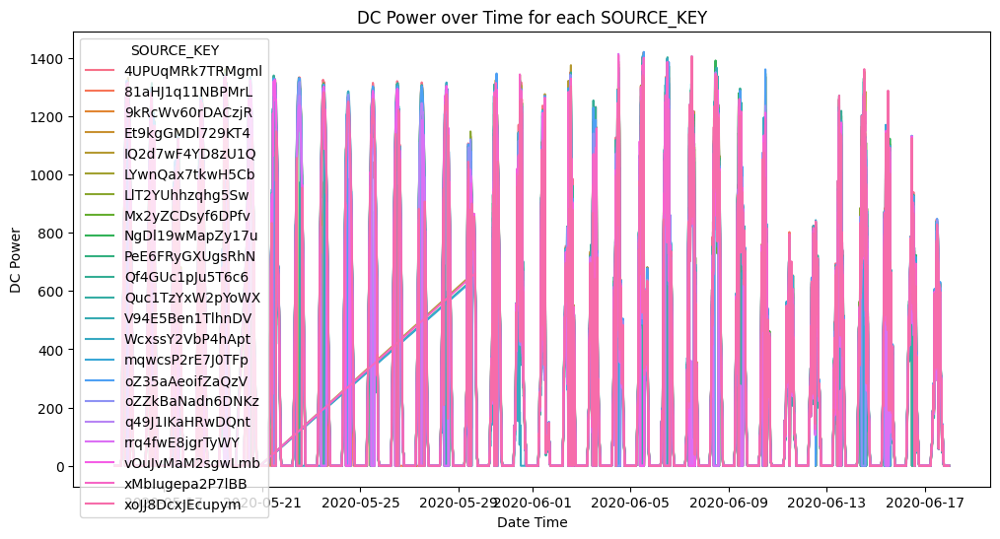

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=solar, x='DATE_TIME', y='DC_POWER', hue='SOURCE_KEY')

# Add labels and title
plt.xlabel('Date Time')
plt.ylabel('DC Power')
plt.title('DC Power over Time for each SOURCE_KEY')

# Show the plot
plt.show()


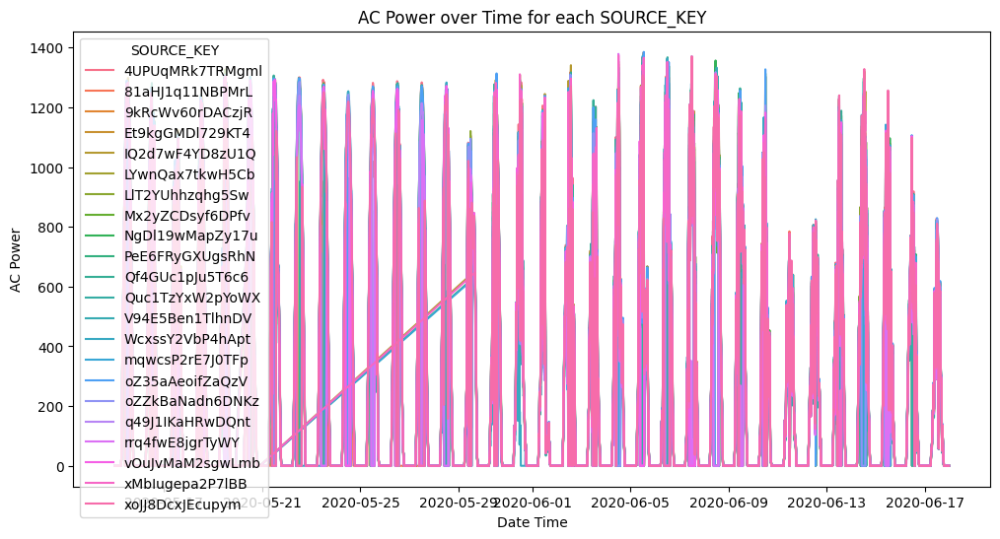

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=solar, x='DATE_TIME', y='AC_POWER', hue='SOURCE_KEY')

# Add labels and title
plt.xlabel('Date Time')
plt.ylabel('AC Power')
plt.title('AC Power over Time for each SOURCE_KEY')

# Show the plot
plt.show()


## Solar Plant Performance Analysis: Key Insights and Anomalies

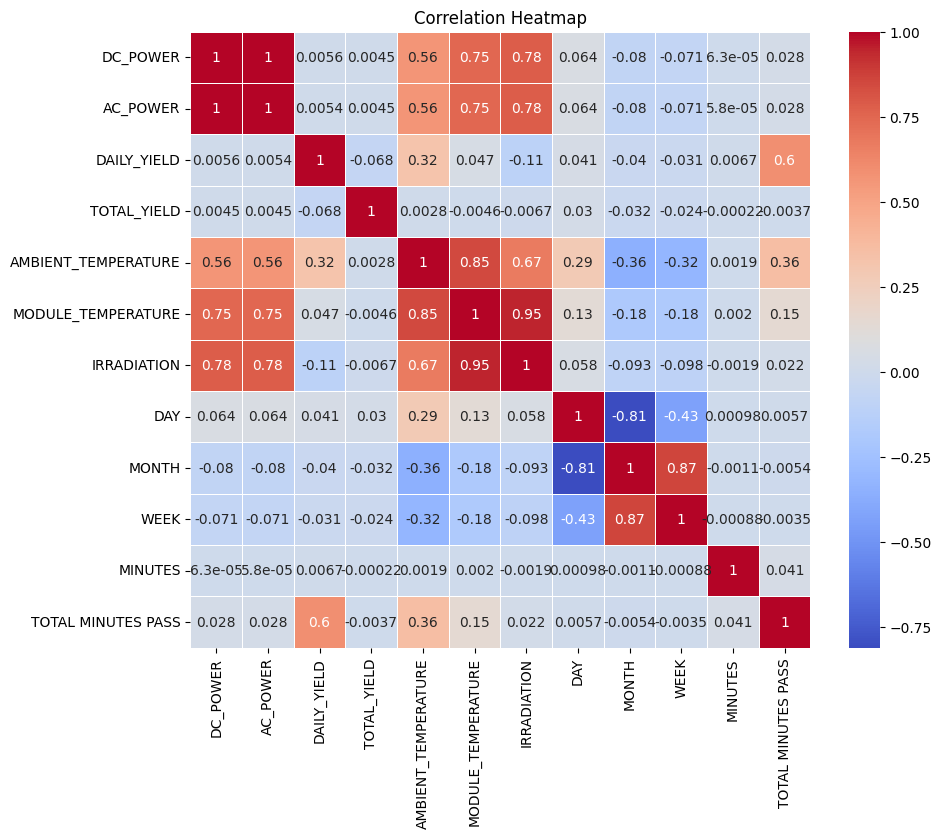

In [ ]:
numeric_columns = solar.select_dtypes(include=np.number).columns.tolist()
corr_df = solar[numeric_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

**DC Power and AC Power:**
Strong positive correlation observed
Indicates efficient power conversion in the inverters.

**Power and Irradiation:** High correlation between power output and solar irradiation
Demonstrates the direct impact of sunlight on energy production.

**Power and Temperature:** Correlation noted between power output and both module and ambient temperatures the temperature influence on solar panel efficiency.


### Daily Yield and AC Power¶

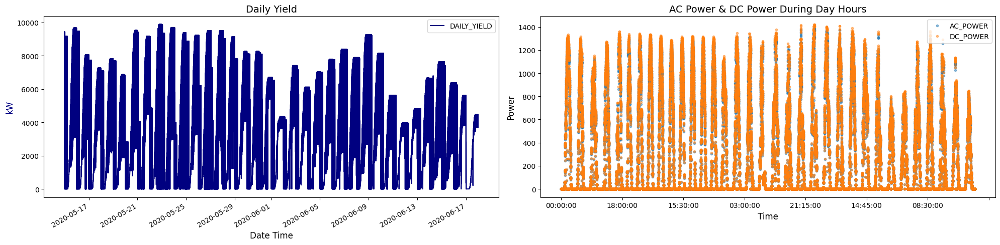

In [ ]:
def plot_daily_yield_and_power(solar):
    fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(20, 5), dpi=100)

    # Daily yield plot
    solar.plot(x='DATE_TIME', y='DAILY_YIELD', color='navy', ax=ax1)
    ax1.set_title('Daily Yield', fontsize=14)
    ax1.set_ylabel('kW', color='navy', fontsize=12)
    ax1.set_xlabel('Date Time', fontsize=12)
    ax1.tick_params(axis='both', which='major', labelsize=10)

    # AC & DC power plot
    power_data = solar.set_index('TIME')[['AC_POWER', 'DC_POWER']]
    power_data.plot(style='.', ax=ax2, alpha=0.5)
    ax2.set_title('AC Power & DC Power During Day Hours', fontsize=14)
    ax2.set_ylabel('Power', fontsize=12)
    ax2.set_xlabel('Time', fontsize=12)
    ax2.tick_params(axis='both', which='major', labelsize=10)
    ax2.legend(fontsize=10)

    plt.tight_layout()
    plt.show()

plot_daily_yield_and_power(solar)

### Daily and Total Yield

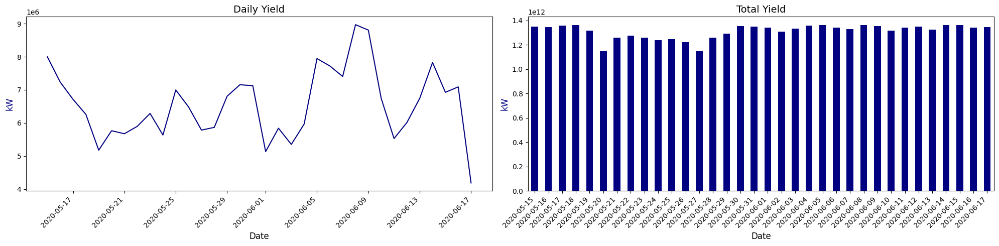

In [ ]:
def plot_daily_yield_and_total_yield(solar):
    # Ensure DATE_TIME is a datetime object
    solar['date'] = pd.to_datetime(solar['DATE_TIME']).dt.date

    # Group by date and sum, exclude 'DATE_TIME' column from sum
    df_plant1_grouped = solar.groupby('date').sum(numeric_only=True)

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 5), dpi=100)

    # Plot Daily Yield
    df_plant1_grouped['DAILY_YIELD'].plot(ax=ax1, color='navy')
    ax1.set_title('Daily Yield', fontsize=14)
    ax1.set_ylabel('kW', color='navy', fontsize=12)
    ax1.set_xlabel('Date', fontsize=12)
    ax1.tick_params(axis='both', which='major', labelsize=10)

    # Plot Total Yield
    df_plant1_grouped['TOTAL_YIELD'].plot(kind='bar', ax=ax2, color='navy')
    ax2.set_title('Total Yield', fontsize=14)
    ax2.set_ylabel('kW', color='navy', fontsize=12)
    ax2.set_xlabel('Date', fontsize=12)
    ax2.tick_params(axis='both', which='major', labelsize=10)

    # Auto-format x-axis labels
    fig.autofmt_xdate(rotation=45)

    # Adjust layout
    plt.tight_layout()
    plt.show()

plot_daily_yield_and_total_yield(solar)

### TOTAL_YIELD by inverter (source key)
shows comparison of the total energy yield across all inverters. The bar chart shows individual inverter performance, and the line plot highlights the decreasing trend in yield. It is useful for identifying the most and least productive inverters, helping assess which inverters might need further investigation or maintenance.






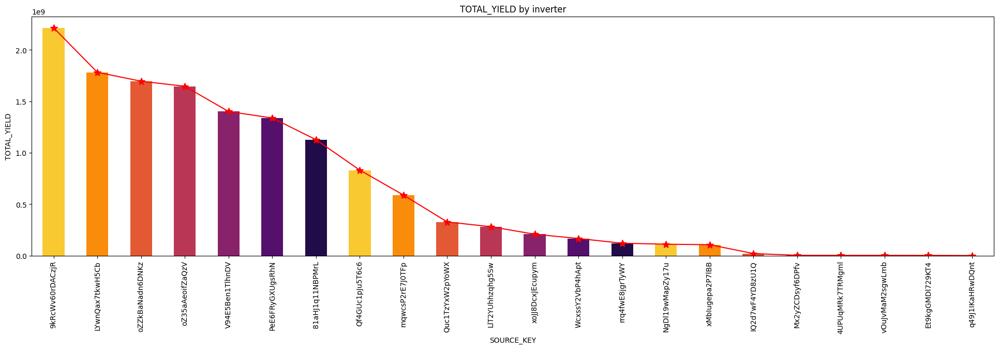

In [ ]:
plt.figure(figsize=(24,6))
plt.title('TOTAL_YIELD by inverter')
plt.ylabel('TOTAL_YIELD')
solar.groupby('SOURCE_KEY')['TOTAL_YIELD'].mean().sort_values(ascending=False).plot(kind='line', marker='*', color='red', ms=10)
solar.groupby('SOURCE_KEY')['TOTAL_YIELD'].mean().sort_values(ascending=False).plot(kind='bar',color=sns.color_palette("inferno_r", 7))
plt.show()

### DAILY_YIELD & IRRADIATION

In [ ]:
fig = px.scatter(solar, x = 'DAILY_YIELD', y = 'IRRADIATION', log_x=True,
                 hover_name="SOURCE_KEY", hover_data=["DAILY_YIELD", "IRRADIATION"],
                color = 'DAILY_YIELD', color_continuous_scale= 'rainbow',
                title = 'Quality or Quantity, That\'s the question')
fig.show()

In [ ]:
dfpie = solar.loc[solar.groupby('SOURCE_KEY')['AMBIENT_TEMPERATURE'].idxmax()]
fig = px.bar(dfpie, x = 'SOURCE_KEY', y = 'AMBIENT_TEMPERATURE',
            text = 'SOURCE_KEY', color = 'DAILY_YIELD',
            title = 'Max AMBIENT_TEMPERATURE')
fig.show()

### Irradiation, Ambient and Module Temperature

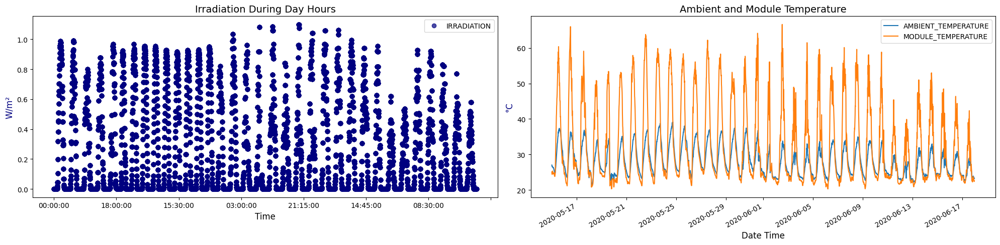

In [ ]:
def plot_irradiation_and_temperature(solar):
    fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(20, 5), dpi=100)

    # Daily irradiation plot
    solar.plot(x='TIME', y='IRRADIATION', ax=ax1, style='o', color='navy', alpha=0.7)
    ax1.set_title('Irradiation During Day Hours', fontsize=14)
    ax1.set_ylabel('W/m²', color='navy', fontsize=12)
    ax1.set_xlabel('Time', fontsize=12)
    ax1.tick_params(axis='both', which='major', labelsize=10)

    # Temperature plot
    solar.set_index('DATE_TIME')[['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE']].plot(ax=ax2)
    ax2.set_title('Ambient and Module Temperature', fontsize=14)
    ax2.set_ylabel('°C', color='navy', fontsize=12)
    ax2.set_xlabel('Date Time', fontsize=12)
    ax2.tick_params(axis='both', which='major', labelsize=10)
    ax2.legend(fontsize=10)

    plt.tight_layout()
    plt.show()

plot_irradiation_and_temperature(solar)


###Temperature:

In [ ]:
solar['AMBIENT_TEMPERATURE'].describe()

,AMBIENT_TEMPERATURE
count,67698.000000
mean,27.986756
std,4.021294
min,20.942385
25%,24.570349
50%,26.910352
75%,30.912601
max,39.181638


In [ ]:
solar['MODULE_TEMPERATURE'].describe()

,MODULE_TEMPERATURE
count,67698.000000
mean,32.607233
std,11.226446
min,20.265123
25%,23.685627
50%,27.433723
75%,40.019036
max,66.635953


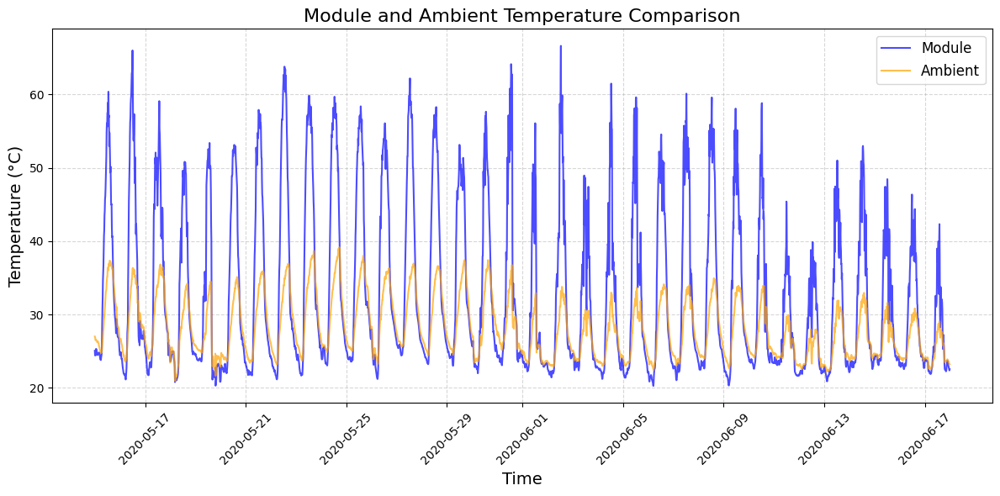

In [ ]:
def plot_temperature(solar):
    plt.figure(figsize=(12, 6))

    # Plot Module and Ambient Temperature
    plt.plot(solar['DATE_TIME'], solar['MODULE_TEMPERATURE'], label="Module", color='blue', linestyle='-', alpha=0.7)
    plt.plot(solar['DATE_TIME'], solar['AMBIENT_TEMPERATURE'], label="Ambient", color='orange', linestyle='-',  alpha=0.7)

    # Add title and labels
    plt.title("Module and Ambient Temperature Comparison", fontsize=16)
    plt.xlabel("Time", fontsize=14)
    plt.ylabel("Temperature (°C)", fontsize=14)

    # Add grid and legend
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(fontsize=12)

    # Rotate x-ticks for better readability
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

plot_temperature(solar)

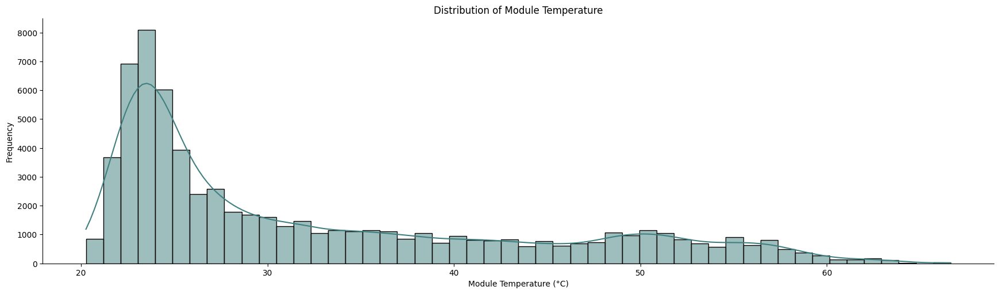

In [ ]:
# Module Temperature
sns.displot(
    data=solar,
    x="MODULE_TEMPERATURE",
    kde=True,
    bins=50,
    color="#3F7F7F",
    height=5,
    aspect=3.5
)
plt.title("Distribution of Module Temperature")
plt.xlabel("Module Temperature (°C)")
plt.ylabel("Frequency")
plt.show()

**Explanation**: shows the frequency of different module temperatures recorded in the solar plant. Most of the temperatures fall between 25°C to 30°C, representing typical operating conditions. As temperatures increase beyond 40°C, they occur less frequently, with very high temperatures (around 60°C) being rare.





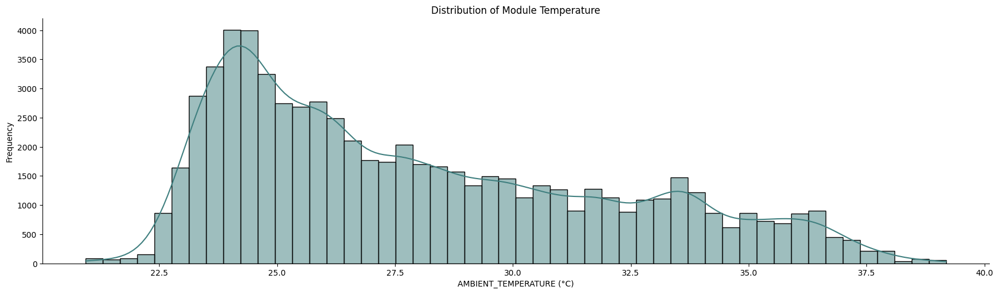

In [ ]:
# AMBIENT Temperature
sns.displot(
    data=solar,
    x="AMBIENT_TEMPERATURE",
    kde=True,
    bins=50,
    color="#3F7F7F",
    height=5,
    aspect=3.5
)
plt.title("Distribution of Module Temperature")
plt.xlabel("AMBIENT_TEMPERATURE (°C)")
plt.ylabel("Frequency")
plt.show()

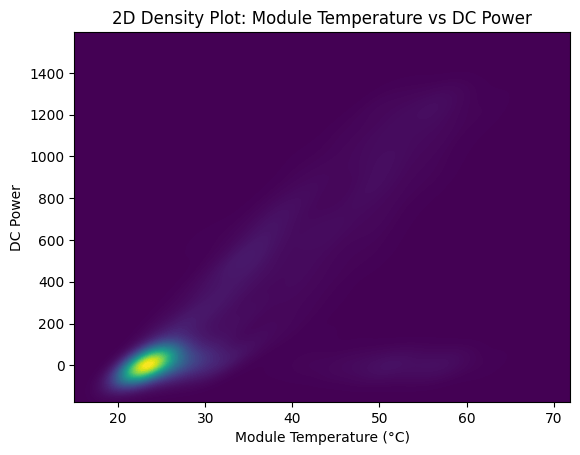

In [ ]:
sns.kdeplot(
    data=solar,
    x="MODULE_TEMPERATURE",
    y="DC_POWER",
    cmap="viridis",
    fill=True,
    thresh=0,
    levels=100
)

plt.title("2D Density Plot: Module Temperature vs DC Power")
plt.xlabel("Module Temperature (°C)")
plt.ylabel("DC Power")
plt.show()


### Average temperature and Maximum temperature between module and ambient:

In [ ]:
mod_amb_avg_diff = solar['MODULE_TEMPERATURE'].mean() - solar['AMBIENT_TEMPERATURE'].mean()
print(f"Average temperature difference between module and ambient: {mod_amb_avg_diff:.2f}°C")
mod_amb_max_diff = solar['MODULE_TEMPERATURE'].max() - solar['AMBIENT_TEMPERATURE'].max()
print(f"Maximum temperature difference between module and ambient: {mod_amb_max_diff:.2f}°C")

Average temperature difference between module and ambient: 4.62°C
Maximum temperature difference between module and ambient: 27.45°C


# Faults & Abnormalities detection in solar power plant generation


##Multiple Plotting of DC_POWER generation on per day

 The shape we observe is influenced by the sun’s angle relative to the solar panels. In the early morning, the sun is at its lowest point in the sky, meaning sunlight must pass through a thicker layer of the atmosphere to reach the panels. As sunlight travels through more atmosphere, more energy is absorbed, leaving less available for the panels to convert into electricity. However, at midday, when the sun is directly overhead, sunlight travels through less atmosphere, allowing the panels to absorb more energy and generate more electricity efficiently.

 **Note**: Reason for very high Fluctuation & Reduction in DC_POWER generation is due to fault in the **system** or may be fluctuation in **weather** or due to clouds etc. which need to be analyse further


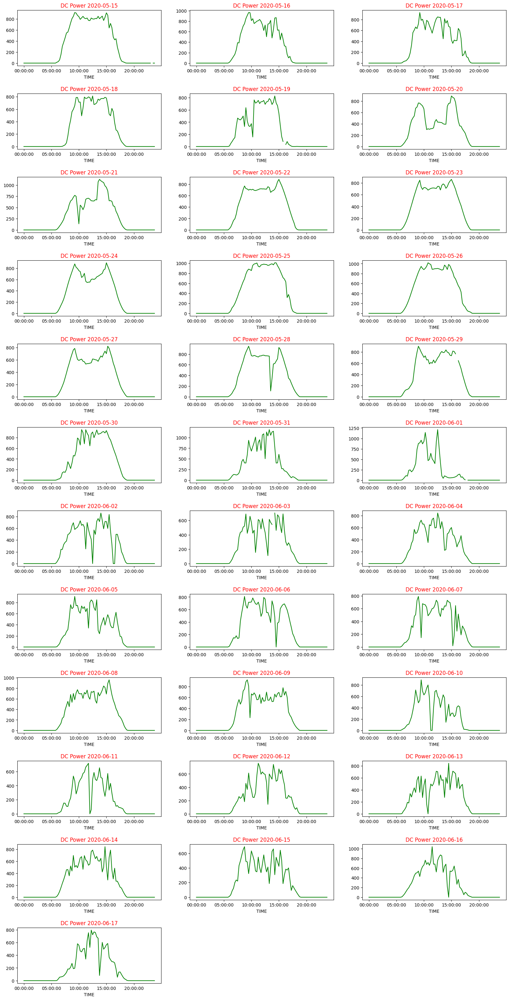

In [ ]:
solar_dc = solar.pivot_table(values='DC_POWER', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='DC Power'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40))

    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='green')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='red')

Daywise_plot(data=solar_dc, row=12, col=3)

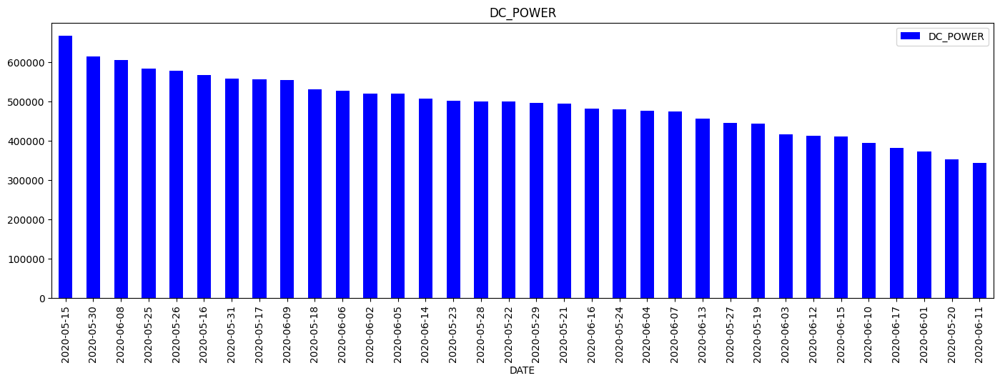

In [ ]:
daily_irradiation = solar.groupby('DATE')['DC_POWER'].agg('sum')
daily_irradiation.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='blue')
plt.title('DC_POWER')
plt.show()

## Multiple Plotting of IRRADIATION generation on per day

IRRADIATION graph pattern is looking very similar to the corresponding DC_POWER generation on per day basis.

In solar power plant DC_POWER or Output power is mostly depends on IRRADIATION .Or it is not wrong to say that it’s directly proportional.


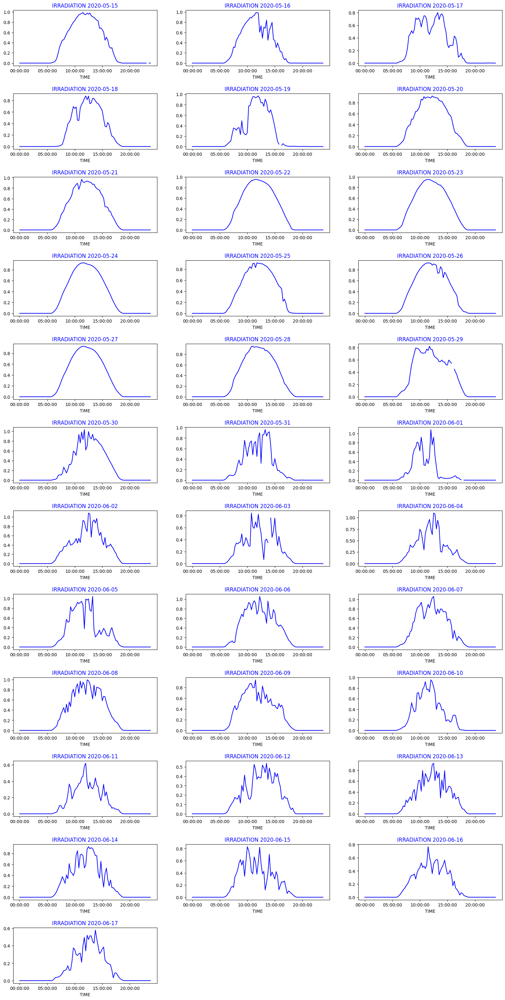

In [ ]:
solar_irradiation = solar.pivot_table(values='IRRADIATION', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='IRRADIATION'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40))

    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='blue')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')

Daywise_plot(data=solar_irradiation, row=12, col=3)


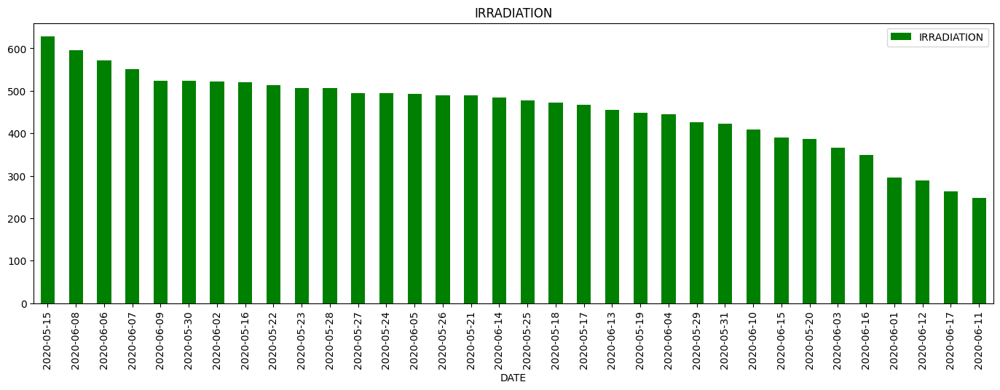

In [ ]:
daily_irradiation = solar.groupby('DATE')['IRRADIATION'].agg('sum')
daily_irradiation.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='green')
plt.title('IRRADIATION')
plt.show()

## Inverter wise

Analyzes how efficiently the inverters in a solar plant convert DC power (Direct Current) into AC power (Alternating Current)
so the Inverter loss is calculated as the percentage of DC power converted into AC power. This helps measure how well the inverter performs

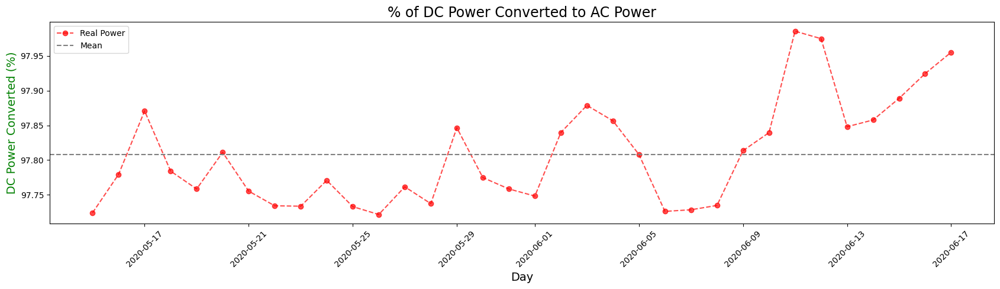

In [ ]:
def plot_inverter_loss(solar):
    # Create a copy of the DataFrame
    loss_df = solar.copy()

    # Extract the date and group by day
    loss_df['Day'] = pd.to_datetime(loss_df['DATE_TIME']).dt.date
    loss_df = loss_df.groupby('Day').sum(numeric_only=True)

    # Calculate inverter loss
    loss_df['inverter_loss'] = (loss_df['AC_POWER'] / loss_df['DC_POWER']) * 100

    # Plot inverter loss
    plt.figure(figsize=(17, 5))
    loss_df['inverter_loss'].plot(style='o--', label='Real Power', color='red', alpha=0.7)

    # Plot mean line
    plt.axhline(loss_df['inverter_loss'].mean(), linestyle='--', color='gray', label='Mean')

    # Add titles and labels
    plt.title('% of DC Power Converted to AC Power', fontsize=17)
    plt.ylabel('DC Power Converted (%)', fontsize=14, color='green')
    plt.xlabel('Day', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_inverter_loss(solar)

### Solar Power Plant Inverter Efficiency Calculation
The inverter efficiency refers to how much dc power will be converted to ac power, as some of power will be lost during this transition in two forms.

In [ ]:
solar_dc_power = solar[solar['DC_POWER'] > 0]['DC_POWER'].values
solar_ac_power = solar[solar['AC_POWER'] > 0]['AC_POWER'].values
solar_plant_eff = (np.max(solar_ac_power)/np.max(solar_dc_power ))*100
solar_loss= 100 - solar_plant_eff
print(f"Power ratio AC/DC (Efficiency) of Solar Power Plant:{solar_plant_eff:0.3f} %")
print(f"Power ratio AC/DC (loss) of Solar Power Plant: {solar_loss:0.3f} %")

Power ratio AC/DC (Efficiency) of Solar Power Plant:97.501 %
Power ratio AC/DC (loss) of Solar Power Plant: 2.499 %


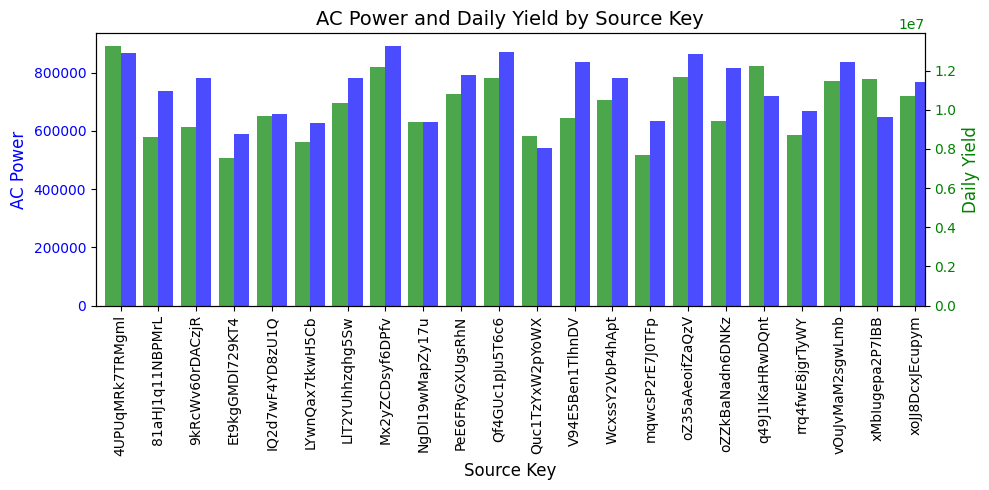

In [ ]:
# Group data
ac_power = solar.groupby('SOURCE_KEY')[['AC_POWER', 'DAILY_YIELD']].sum()

# Create a figure and axis
fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot AC_POWER on the first y-axis
ac_power['AC_POWER'].plot(kind='bar', ax=ax1, color='blue', position=0, width=0.4, label='AC Power', alpha=0.7)
ax1.set_ylabel('AC Power', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot DAILY_YIELD on the second y-axis
ac_power['DAILY_YIELD'].plot(kind='bar', ax=ax2, color='green', position=1, width=0.4, label='Daily Yield', alpha=0.7)
ax2.set_ylabel('Daily Yield', color='green', fontsize=12)
ax2.tick_params(axis='y', labelcolor='green')

# Set title and labels
plt.title('AC Power and Daily Yield by Source Key', fontsize=14)
ax1.set_xlabel('Source Key', fontsize=12)

# Adjust layout
fig.tight_layout()

plt.show()

# Split The data

In [ ]:
df = solar.copy()

In [ ]:
df=df.set_index("DATE_TIME")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 67698 entries, 2020-05-15 00:00:00 to 2020-06-17 23:45:00
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   SOURCE_KEY           67698 non-null  object 
 1   DC_POWER             67698 non-null  float64
 2   AC_POWER             67698 non-null  float64
 3   DAILY_YIELD          67698 non-null  float64
 4   TOTAL_YIELD          67698 non-null  float64
 5   AMBIENT_TEMPERATURE  67698 non-null  float64
 6   MODULE_TEMPERATURE   67698 non-null  float64
 7   IRRADIATION          67698 non-null  float64
 8   DATE                 67698 non-null  object 
 9   TIME                 67698 non-null  object 
 10  DAY                  67698 non-null  int32  
 11  MONTH                67698 non-null  int32  
 12  WEEK                 67698 non-null  UInt32 
 13  HOURS                67698 non-null  object 
 14  MINUTES              67698 non-null  int32  
 15  T

In [ ]:
df=df.resample("H")["AMBIENT_TEMPERATURE","MODULE_TEMPERATURE","IRRADIATION","DC_POWER"].mean()
df.head()

,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DC_POWER
DATE_TIME,,,,
2020-05-15 00:00:00,26.767055,24.582656,0.0,0.0
2020-05-15 01:00:00,26.505909,25.172109,0.0,0.0
2020-05-15 02:00:00,26.296562,24.555514,0.0,0.0
2020-05-15 03:00:00,26.141691,24.627655,0.0,0.0
2020-05-15 04:00:00,25.509473,24.658230,0.0,0.0


In [ ]:
X = df[['AMBIENT_TEMPERATURE','MODULE_TEMPERATURE','IRRADIATION']]
y = df['DC_POWER']

# XGBRegressor with gridsearch model

In [ ]:
X

,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
DATE_TIME,,,
2020-05-15 00:00:00,26.767055,24.582656,0.0
2020-05-15 01:00:00,26.505909,25.172109,0.0
2020-05-15 02:00:00,26.296562,24.555514,0.0
2020-05-15 03:00:00,26.141691,24.627655,0.0
2020-05-15 04:00:00,25.509473,24.658230,0.0
...,...,...,...
2020-06-17 19:00:00,23.530150,22.480403,0.0
2020-06-17 20:00:00,23.676085,22.454153,0.0
2020-06-17 21:00:00,23.836589,23.519539,0.0


In [ ]:
X_train,X_test, y_train, y_test= train_test_split(X,y,train_size=0.8,random_state=2021)

In [ ]:
X_train,X_val, y_train, y_val= train_test_split(X_train,y_train,train_size=0.8,random_state=2021)

In [ ]:
# Initialize the standard scaler for preprocessing
preproc2 = StandardScaler()

X_train_preproc = preproc2.fit_transform(X_train, y_train)
X_val_preproc = preproc2.transform(X_val)
X_test_preproc = preproc2.transform(X_test)

In [ ]:
xgb_model= XGBRegressor(random_state= 2021)

In [ ]:
#make a dictonary of hyperparmaters
search_space={
    'n_estimators': [100,200,500],
    'max_depth': [3,6,9],
    'gamma': [0.01,0.1],
    'learning_rate': [0.001,0.01,0.1,1]
}

In [ ]:
gs = GridSearchCV(estimator = xgb_model,
                  param_grid= search_space,
                  scoring = ['r2','neg_mean_absolute_error'],#mean_absolute_error, neg_mean_absolute_error
                  refit= 'r2',
                  cv=5,
                  verbose= 4
)

In [ ]:
gs.fit(X_train_preproc,y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END gamma=0.01, learning_rate=0.001, max_depth=3, n_estimators=100; neg_mean_absolute_error: (test=-268.085) r2: (test=0.166) total time=   0.0s
[CV 2/5] END gamma=0.01, learning_rate=0.001, max_depth=3, n_estimators=100; neg_mean_absolute_error: (test=-252.418) r2: (test=0.179) total time=   0.0s
[CV 3/5] END gamma=0.01, learning_rate=0.001, max_depth=3, n_estimators=100; neg_mean_absolute_error: (test=-259.082) r2: (test=0.162) total time=   0.0s
[CV 4/5] END gamma=0.01, learning_rate=0.001, max_depth=3, n_estimators=100; neg_mean_absolute_error: (test=-263.450) r2: (test=0.172) total time=   0.0s
[CV 5/5] END gamma=0.01, learning_rate=0.001, max_depth=3, n_estimators=100; neg_mean_absolute_error: (test=-256.165) r2: (test=0.166) total time=   0.0s
[CV 1/5] END gamma=0.01, learning_rate=0.001, max_depth=3, n_estimators=200; neg_mean_absolute_error: (test=-243.601) r2: (test=0.304) total time=   0.1s
[CV 2/5] END g

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=2021, ...),
             param_grid={'gamma': [0.01, 0.1],
                         'learning_rate': [0.001, 0.01, 0.1, 1],
                         'max_depth': [3, 6, 9],
                         'n_estimators': [100, 200, 500]},
             refit='r2', scoring=['r2', 'neg_mean_absolute_error'], verbose=4)

In [ ]:
# Display the best parameters and the corresponding R^2 score
print("Best parameters found: ", gs.best_params_)
print("Best R^2 score: ", gs.best_score_)


Best parameters found:  {'gamma': 0.01, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
Best R^2 score:  0.953669594219656


In [ ]:
# Evaluate the model on the validation set
y_val_pred = gs.predict(X_val_preproc)
mae_val = mean_absolute_error(y_val, y_val_pred)
rmse_val = np.sqrt(mean_squared_error(y_val, y_val_pred))
print("Mean Absolute Error on Validation Set: ", mae_val)
print("RMSE on Validation Set: ", rmse_val)


Mean Absolute Error on Validation Set:  37.59355064754041
RMSE on Validation Set:  80.74146116862953


In [ ]:
# Evaluate the model on the test set
y_test_pred = gs.predict(X_test_preproc)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print("Mean Absolute Error on Test Set: ", mae_test)
print("RMSE on Test Set: ", rmse_test)


Mean Absolute Error on Test Set:  37.09024909684772
RMSE on Test Set:  81.5957291933781


In [ ]:
y.mean()

248.87088119552809

# RandomForst model

In [ ]:
rf = RandomForestRegressor(random_state=42)

In [ ]:
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
evalute_train= rf.score(X_train, y_train)
evalute_train

0.9933223132099929

In [ ]:
# Perform 5-fold cross-validation on the training set
cross_validate(rf, X_train, y_train, cv=5)

{'fit_time': array([0.1874547 , 0.19846201, 0.23401999, 0.19937491, 0.18628621]),
 'score_time': array([0.0072279 , 0.00711179, 0.01467133, 0.00722265, 0.00716782]),
 'test_score': array([0.94418142, 0.96980945, 0.96765244, 0.94604444, 0.94042435])}

In [ ]:
# Evaluate the model on the test sample R²
evalute_test= rf.score(X_test, y_test)
evalute_test

0.9104334870303501

In [ ]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [ ]:
param_grid = {
    'model__n_estimators': [300, 500],
    'model__max_depth': [10, 20],
    'model__min_samples_split': [2, 5]
}

In [ ]:
pipe = Pipeline([('model', rf)])

In [ ]:
from sklearn.metrics import make_scorer, mean_squared_error
scorer = make_scorer(mean_squared_error, greater_is_better=False)

In [ ]:
grid = GridSearchCV(pipe, param_grid, cv=5,scoring=scorer)

In [ ]:
grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('model',
                                        RandomForestRegressor(random_state=42))]),
             param_grid={'model__max_depth': [10, 20],
                         'model__min_samples_split': [2, 5],
                         'model__n_estimators': [300, 500]},
             scoring=make_scorer(mean_squared_error, greater_is_better=False, response_method='predict'))

In [ ]:
# find best parama
grid.best_params_

{'model__max_depth': 10,
 'model__min_samples_split': 2,
 'model__n_estimators': 500}

In [ ]:
# select best estimator
best = grid.best_estimator_

In [ ]:
# fit best estimator
best.fit(X_train,y_train)

Pipeline(steps=[('model',
                 RandomForestRegressor(max_depth=10, n_estimators=500,
                                       random_state=42))])

In [ ]:
# predict with best estimator
y_pred=best.predict(X_test)
y_pred

array([0.00000000e+00, 9.50828102e+02, 2.48559294e+02, 7.93346262e+02,
       6.56104493e+02, 7.99558604e+02, 0.00000000e+00, 3.11221837e-01,
       8.36257896e+02, 0.00000000e+00, 6.52336126e+02, 7.09293024e+02,
       0.00000000e+00, 6.88199193e+02, 0.00000000e+00, 6.31485865e+02,
       4.47121643e+02, 4.51535475e+02, 0.00000000e+00, 3.35183351e+02,
       3.65091675e+01, 7.50099609e+01, 0.00000000e+00, 0.00000000e+00,
       6.39903399e+02, 0.00000000e+00, 0.00000000e+00, 8.94021504e+02,
       0.00000000e+00, 0.00000000e+00, 8.21934035e+02, 2.67225985e+01,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.77743666e+02,
       3.29161799e+02, 0.00000000e+00, 2.44290457e+02, 7.51288584e+01,
       7.96631077e+02, 0.00000000e+00, 0.00000000e+00, 7.43495472e+02,
       0.00000000e+00, 3.60955994e+02, 6.59329903e+02, 0.00000000e+00,
       5.65703265e+02, 8.65770066e+02, 7.34371577e+02, 8.17203283e+02,
       4.81320498e+02, 0.00000000e+00, 0.00000000e+00, 2.67521110e+02,
      

In [ ]:
# mean absolute error
mean_absolute_error(y_test,y_pred)

34.14795635619182

In [ ]:
41/y.mean()

0.16474406247546458

In [ ]:
# r square
r2_score(y_test,y_pred)

0.9105241356537808

In [ ]:
# Initialize TPOTRegressor to automatically find and optimize the best ML pipeline
pipeline_optimizer = TPOTRegressor(generations=5, population_size=20, cv=5,
                                    random_state=42, verbosity=2)
pipeline_optimizer.fit(X_train, y_train)


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -4610.390185637126

Generation 2 - Current best internal CV score: -4610.390185637126

Generation 3 - Current best internal CV score: -4610.390185637126

Generation 4 - Current best internal CV score: -4458.387834806383

Generation 5 - Current best internal CV score: -4391.120103463951

Best pipeline: AdaBoostRegressor(RidgeCV(input_matrix), learning_rate=0.001, loss=square, n_estimators=100)


TPOTRegressor(generations=5, population_size=20, random_state=42, verbosity=2)

In [ ]:
print(pipeline_optimizer.score(X_test, y_test))

-6387.679126227641


In [ ]:
pipeline_optimizer.export('tpot_exported_pipeline.py')

In [ ]:
# Evaluate the model on the test set
y_test_pred = pipeline_optimizer.predict(X_test)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print("Mean Absolute Error on Test Set: ", mae_test)
print("RMSE on Test Set: ", rmse_test)

Mean Absolute Error on Test Set:  38.41981161417284
RMSE on Test Set:  79.92295744169907


# Decision Tree Regressor model


In [ ]:
dtr = DecisionTreeRegressor(max_depth=3, random_state=2529)

##Train the model

In [ ]:
dtr.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3, random_state=2529)

## Model Evaluation

In [ ]:
# Evaluate the model on the training sample R² Score
evalute_train= dtr.score(X_train, y_train)
evalute_train

0.9589147030453731

## Cross-Validation to ensures the model is not overfitting by testing it on different subsets of the training data.

In [ ]:
# Perform 5-fold cross-validation on the training set
cross_validate(dtr, X_train, y_train, cv=5)


{'fit_time': array([0.00376081, 0.00253606, 0.0024941 , 0.00239301, 0.00239658]),
 'score_time': array([0.00176406, 0.00167274, 0.00160289, 0.00158262, 0.00160193]),
 'test_score': array([0.9466973 , 0.95629173, 0.96231537, 0.946742  , 0.93778883])}

In [ ]:
# Evaluate the model on the test sample R²
evalute_test= dtr.score(X_test, y_test)
evalute_test

0.9132415279573051

## Hyperparameter Tuning with GridSearchCV

In [ ]:
dtr.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': 2529,
 'splitter': 'best'}

In [ ]:
# the parameter grid for tuning
params = {'model__max_depth' : [2,3,4,5,6,7,8, 9, 10],
        'model__criterion' : ['squared_error', 'absolute_error'],
        'model__random_state' : [2529]}

## Create a pipeline

In [ ]:
pipe = Pipeline([('model', dtr)])

## Initialize GridSearchCV



In [ ]:
from sklearn.metrics import make_scorer, mean_squared_error
scorer = make_scorer(mean_squared_error, greater_is_better=False)


In [ ]:
grid = GridSearchCV(pipe, params, cv=5,scoring=scorer)

In [ ]:
grid

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('model',
                                        DecisionTreeRegressor(max_depth=3,
                                                              random_state=2529))]),
             param_grid={'model__criterion': ['squared_error',
                                              'absolute_error'],
                         'model__max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'model__random_state': [2529]},
             scoring=make_scorer(mean_squared_error, greater_is_better=False, response_method='predict'))

In [ ]:
# Train the GridSearchCV
grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('model',
                                        DecisionTreeRegressor(max_depth=3,
                                                              random_state=2529))]),
             param_grid={'model__criterion': ['squared_error',
                                              'absolute_error'],
                         'model__max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'model__random_state': [2529]},
             scoring=make_scorer(mean_squared_error, greater_is_better=False, response_method='predict'))

In [ ]:
# find best parama
grid.best_params_

{'model__criterion': 'absolute_error',
 'model__max_depth': 4,
 'model__random_state': 2529}

In [ ]:
# select best estimator
best = grid.best_estimator_

In [ ]:
# fit best estimator
best.fit(X_train,y_train)

Pipeline(steps=[('model',
                 DecisionTreeRegressor(criterion='absolute_error', max_depth=4,
                                       random_state=2529))])

## Final Model Training with Best Parameters

In [ ]:
# predict with best estimator
y_pred=best.predict(X_test)
y_pred

array([  0.        , 836.98177098, 238.15503307, 836.98177098,
       622.32744589, 702.42142857,   0.        ,   0.        ,
       836.98177098,   0.        , 702.42142857, 702.42142857,
         0.        , 702.42142857,   0.        , 622.32744589,
       438.35368506, 438.35368506,   0.        , 336.44312229,
        37.00449134,  69.81751864,   0.        ,   0.        ,
       622.32744589,   0.        ,   0.        , 836.98177098,
         0.        ,   0.        , 836.98177098,  37.00449134,
         0.        ,   0.        ,   0.        , 836.98177098,
       290.80743747,   0.        , 238.15503307,  69.81751864,
       836.98177098,   0.        ,   0.        , 738.1976422 ,
         0.        , 336.44312229, 622.32744589,   0.        ,
       576.3807766 , 836.98177098, 702.42142857, 836.98177098,
       438.35368506,   0.        ,   0.        , 290.80743747,
       154.88118506, 290.80743747, 238.15503307,   0.        ,
       154.88118506, 622.32744589, 836.98177098,  37.00

In [ ]:
# mean absolute error
mean_absolute_error(y_test,y_pred)

36.15803709419841

In [ ]:
41/y.mean()

0.16474406247546458

In [ ]:
# r square
r2_score(y_test,y_pred)


0.9164406068202968

In [ ]:
# mean absolute percentage error
mean_absolute_percentage_error(y_test,y_pred)

0.09934913907825366

#Linear Regression

In [ ]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred = lr.predict(X_test)

In [ ]:
# Evaluate the Model
R2_Score = r2_score(y_test, y_pred) * 100
mse = mean_squared_error(y_test, y_pred)

print(f'LR Model R² Score: {R2_Score:.2f}%')
print(f'Mean Squared Error: {mse:.2f}')

LR Model R² Score: 83.29%
Mean Squared Error: 12736.23


In [ ]:
# Cross-Validation
cv_scores = cross_val_score(lr, X, y, cv=5, scoring='r2')
print(f'Cross-Validation R² Scores: {cv_scores}')
print(f'Mean CV R² Score: {cv_scores.mean() * 100:.2f}%')

Cross-Validation R² Scores: [0.86337889 0.90467693 0.89329813 0.87491173 0.84898625]
Mean CV R² Score: 87.71%


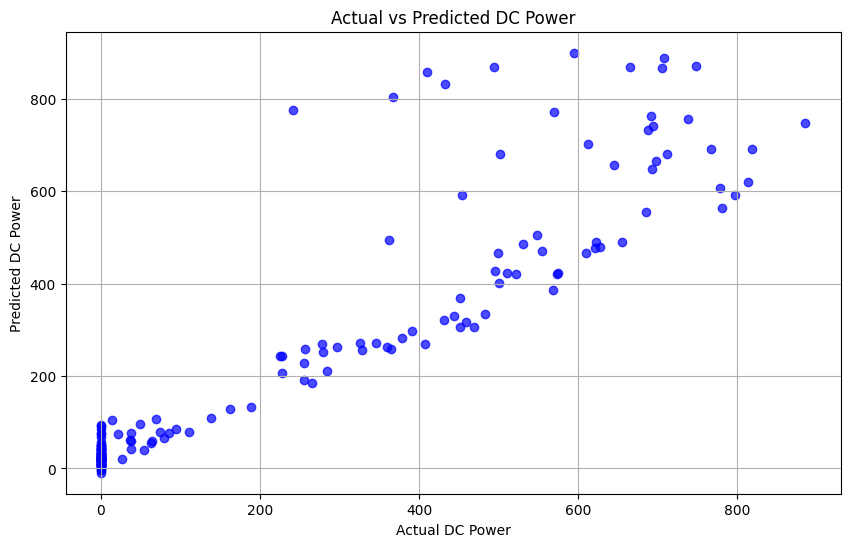

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color='b')
plt.xlabel('Actual DC Power')
plt.ylabel('Predicted DC Power')
plt.title('Actual vs Predicted DC Power')
plt.grid(True)
plt.show()

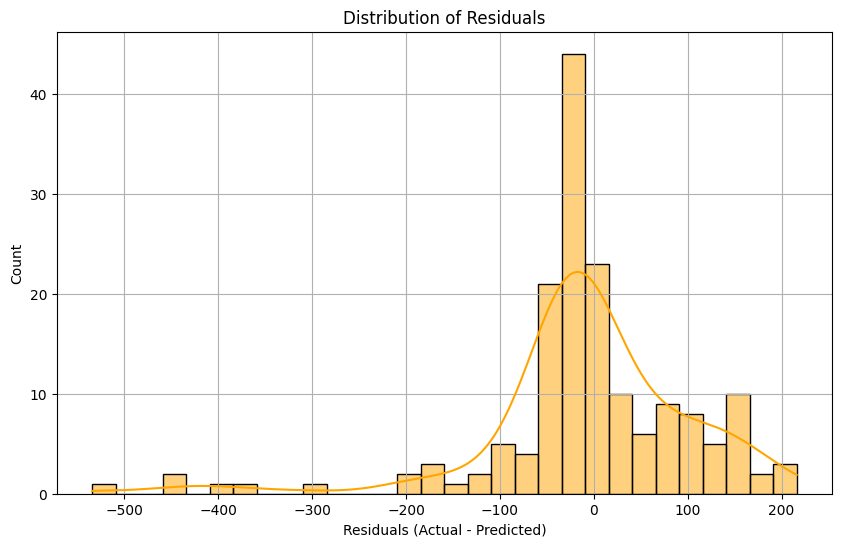

In [ ]:
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, bins=30, color='orange')
plt.xlabel('Residuals (Actual - Predicted)')
plt.title('Distribution of Residuals')
plt.grid(True)
plt.show()

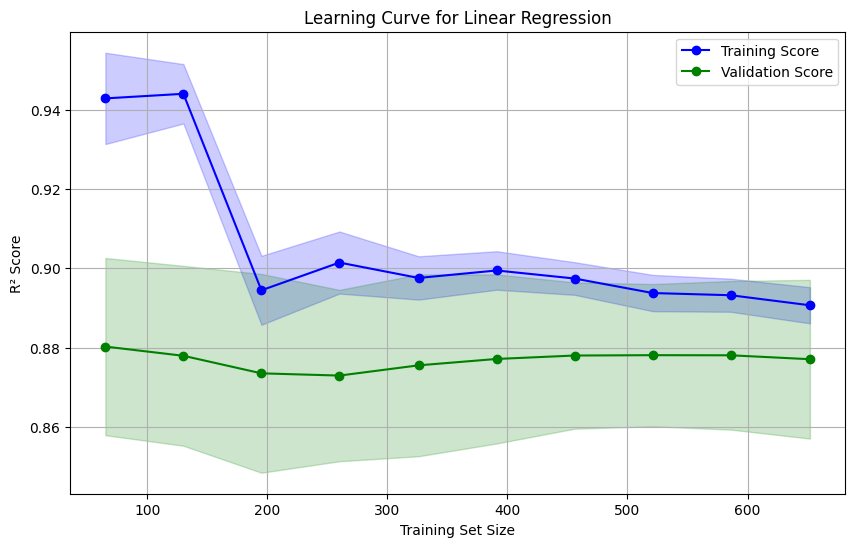

In [ ]:
# Generate Learning Curve Data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lr, X=X, y=y, cv=5, scoring='r2', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate Means and Standard Deviations
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the Learning Curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')

# Add Shaded Area for Standard Deviations
plt.fill_between(train_sizes,
                 train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')
plt.fill_between(train_sizes,
                 test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

# Labels, Title, and Grid
plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for Linear Regression')
plt.legend(loc='best')
plt.grid(True)
plt.show()


#MLP Regressor (Neural Network)

In [ ]:
# Initialize the MLP Regressor with two hidden layers (64, 64 neurons)
mlp = MLPRegressor(hidden_layer_sizes=(64, 64), activation='relu',
                   solver='adam', max_iter=500, random_state=42)

# Train the model
mlp.fit(X_train, y_train)

MLPRegressor(hidden_layer_sizes=(64, 64), max_iter=500, random_state=42)

In [ ]:
# Predict on test data
y_pred = mlp.predict(X_test)


In [ ]:
# Calculate R² Score and Mean Squared Error
r2 = r2_score(y_test, y_pred) * 100
mse = mean_squared_error(y_test, y_pred)

print(f'MLP Regressor R² Score: {r2:.2f}%')
print(f'Mean Squared Error: {mse:.2f}')
# not performing well.

MLP Regressor R² Score: 89.22%
Mean Squared Error: 8220.72


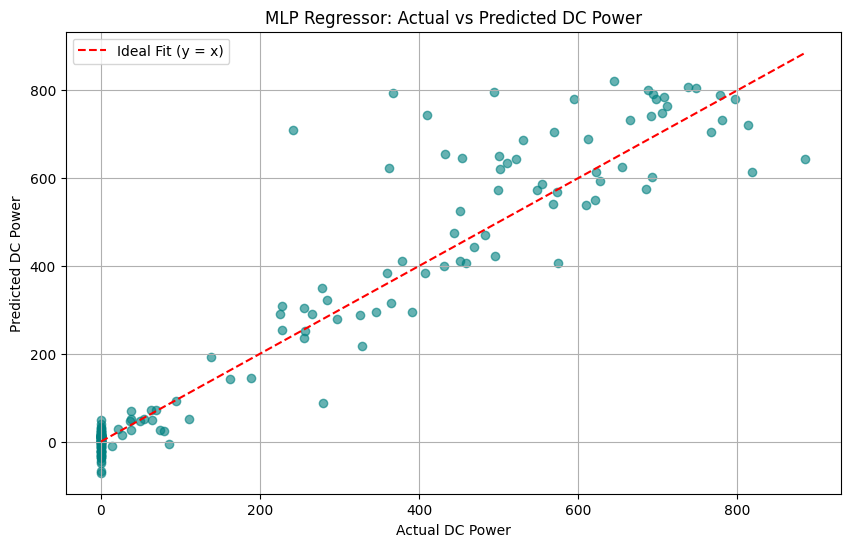

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='teal')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit (y = x)')
plt.xlabel('Actual DC Power')
plt.ylabel('Predicted DC Power')
plt.title('MLP Regressor: Actual vs Predicted DC Power')
plt.legend()
plt.grid(True)
plt.show()


The current model is not good based on the extremely negative R² score and large MSE.

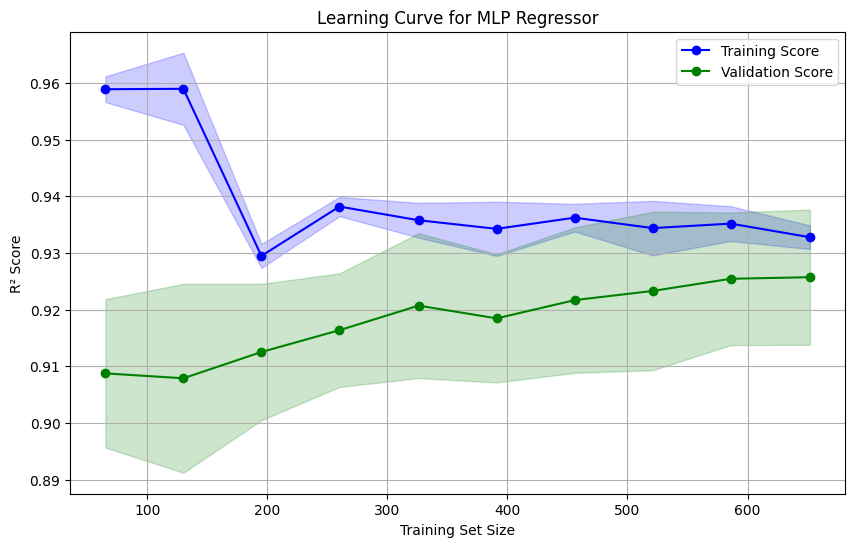

In [ ]:
# Initialize the MLP Regressor
mlp_model = MLPRegressor(
    hidden_layer_sizes=(64, 64),
    activation='relu',
    solver='adam',
    max_iter=500,
    random_state=42
)

# Generate learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=mlp_model,
    X=X,
    y=y,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate the mean and standard deviation of training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')

plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for MLP Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


#LightGBM Regressor

In [ ]:
from lightgbm import LGBMRegressor, early_stopping
from sklearn.model_selection import cross_val_score

In [ ]:
# Initialize and train
lgb = LGBMRegressor(n_estimators=100, max_depth=5, learning_rate=0.1, random_state=42)
lgb.fit(X_train, y_train)

# Predict
y_pred = lgb.predict(X_test)

# Evaluate
r2 = r2_score(y_test, y_pred) * 100
mse = mean_squared_error(y_test, y_pred)

print(f'LightGBM R² Score: {r2:.2f}%')
print(f'Mean Squared Error: {mse:.2f}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info] Start training from score 254.223364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [ ]:
# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [20, 30, 40]
}

# Initialize
lgb = LGBMRegressor(random_state=42)

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=lgb, param_grid=param_grid,
                           cv=5, scoring='r2', n_jobs=-1, verbose=1)

# Train
grid_search.fit(X_train, y_train)

# best parameters
print(f'Best Parameters: {grid_search.best_params_}')


Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info] Start training from score 254.223364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

In [ ]:
# Predict on the test data using the best model
y_pred_tuned = grid_search.best_estimator_.predict(X_test)

# Evaluate
r2 = r2_score(y_test, y_pred_tuned) * 100
mse = mean_squared_error(y_test, y_pred_tuned)

print(f'Tuned LightGBM R² Score: {r2:.2f}%')
print(f'Tuned Mean Squared Error: {mse:.2f}')

Tuned LightGBM R² Score: 92.50%
Tuned Mean Squared Error: 5718.91


In [ ]:
cv_scores = cross_val_score(grid_search.best_estimator_, X, y, cv=5, scoring='r2')
print(f'Cross-Validation R² Scores: {cv_scores}')
print(f'Mean CV R² Score: {cv_scores.mean() * 100:.2f}%')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 571
[LightGBM] [Info] Number of data points in the train set: 652, number of used features: 3
[LightGBM] [Info] Start training from score 244.176519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

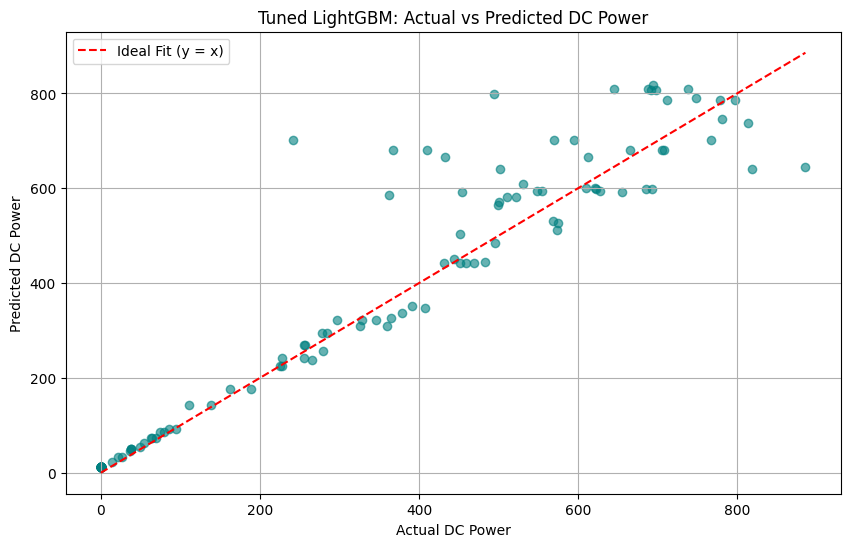

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_tuned, alpha=0.6, color='teal')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit (y = x)')
plt.xlabel('Actual DC Power')
plt.ylabel('Predicted DC Power')
plt.title('Tuned LightGBM: Actual vs Predicted DC Power')
plt.legend()
plt.grid(True)
plt.show()


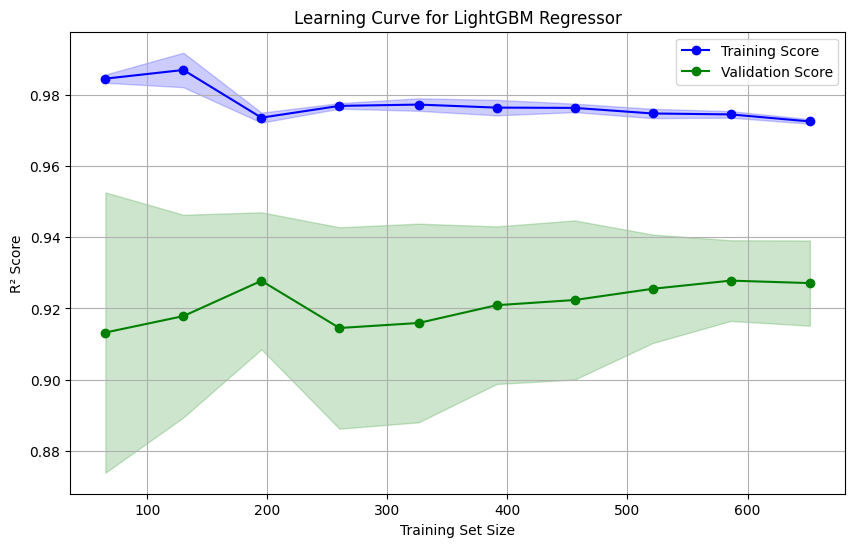

In [ ]:
# Initialize the LightGBM Regressor
lgb_model = LGBMRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    random_state=42
)

# Generate learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lgb_model,
    X=X,
    y=y,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')

plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for LightGBM Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


###trying to fix the overfitting

In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    reg_alpha=0.1,  # L1 regularization
    reg_lambda=0.1,  # L2 regularization
    random_state=42
)

# Fit the model
lgb_model.fit(X_train, y_train)
# This helps reduce overfitting by penalizing overly complex models.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info] Start training from score 254.223364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

LGBMRegressor(max_depth=5, random_state=42, reg_alpha=0.1, reg_lambda=0.1)

In [ ]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
import lightgbm as lgb

lgb_model = LGBMRegressor(
    n_estimators=1000,
    max_depth=5,
    learning_rate=0.1,
    random_state=42
)

# Fit the model with early stopping
lgb_model.fit(
    X_train, y_train,
    eval_set=[(X_test, y_test)],
    eval_metric='rmse',
    # early_stopping_rounds=50,  # Stops if no improvement in 50 rounds
    # verbose=True
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info] Start training from score 254.223364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

LGBMRegressor(max_depth=5, n_estimators=1000, random_state=42)

In [ ]:
# Make predictions using the trained model
y_pred = lgb_model.predict(X_test)


In [ ]:
# Evaluate the model
from sklearn.metrics import r2_score, mean_squared_error

r2 = r2_score(y_test, y_pred) * 100
mse = mean_squared_error(y_test, y_pred)

print(f'LightGBM R² Score: {r2:.2f}%')
print(f'Mean Squared Error: {mse:.2f}')

LightGBM R² Score: 88.91%
Mean Squared Error: 8456.39


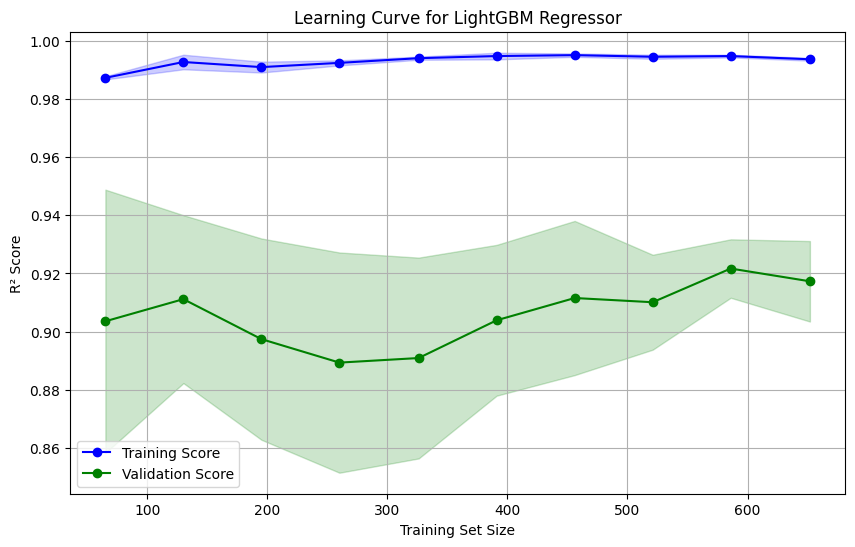

In [ ]:
# Initialize the LightGBM Regressor with the final parameters
lgb_model = LGBMRegressor(
    n_estimators=1000,
    max_depth=5,
    learning_rate=0.1,
    reg_alpha=0.1,  # L1 regularization
    reg_lambda=0.1,  # L2 regularization
    random_state=42
)

# Generate the learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lgb_model,
    X=X,
    y=y,
    cv=5,
    scoring='r2',  # Use R² as the evaluation metric
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)  # Vary training sizes from 10% to 100%
)

# Calculate the mean and standard deviation for training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))

# Plot training score
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')

# Plot validation score
plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

# Labels, title, and grid
plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for LightGBM Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=500,
    max_depth=3,  # Make trees shallower
    learning_rate=0.05,  # Slower learning
    reg_alpha=1.0,  # Stronger L1 regularization
    reg_lambda=1.0,  # Stronger L2 regularization
    random_state=42
)


In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=500,
    max_depth=3,
    num_leaves=20,  # Fewer leaves per tree
    learning_rate=0.05,
    random_state=42
)


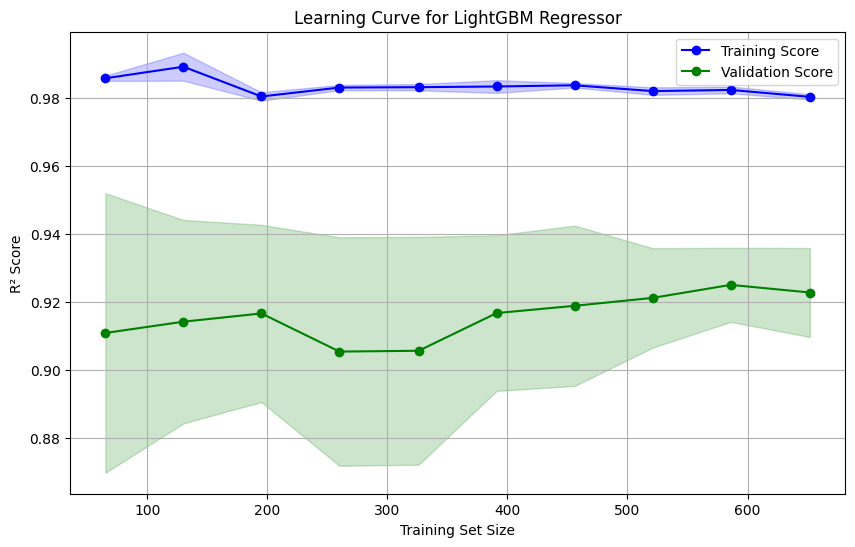

In [ ]:
# Initialize the LightGBM Regressor with final parameters
lgb_model = LGBMRegressor(
    n_estimators=500,
    max_depth=5,
    learning_rate=0.05,
    reg_alpha=1.0,  # Stronger L1 regularization
    reg_lambda=1.0,  # Stronger L2 regularization
    random_state=42
)

# Generate learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lgb_model,
    X=X,
    y=y,
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # Use R² as the metric
    n_jobs=-1,  # Use all available cores
    train_sizes=np.linspace(0.1, 1.0, 10)  # Training set sizes from 10% to 100%
)

# Calculate mean and standard deviation for training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))

# Plot training score
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')

# Plot validation score
plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

# Labels and title
plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for LightGBM Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=500,
    max_depth=3,
    num_leaves=10,  # Fewer leaf nodes for simplicity
    learning_rate=0.05,
    reg_alpha=10.0,  # Stronger L1 regularization
    reg_lambda=10.0,  # Stronger L2 regularization
    random_state=42
)


In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=300,
    max_depth=2,
    num_leaves=5,  # Very few leaves
    learning_rate=0.05,
    random_state=42
)


In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=500,
    max_depth=3,
    num_leaves=20,
    learning_rate=0.05,
    reg_alpha=1.0,
    reg_lambda=1.0,
    feature_fraction=0.8,  # Use only 80% of features per iteration
    bagging_fraction=0.8,  # Use only 80% of data per iteration
    bagging_freq=5,  # Perform bagging every 5 iterations
    random_state=42
)


In [ ]:
y_train_log = np.log1p(y_train)  # Apply log transformation
y_test_log = np.log1p(y_test)

# Train the model on transformed target
lgb_model.fit(X_train, y_train_log)
y_pred_log = lgb_model.predict(X_test)

# Reverse the log transformation for evaluation
y_pred = np.expm1(y_pred_log)


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info]

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [2, 3, 4],
    'num_leaves': [5, 10, 20],
    'learning_rate': [0.01, 0.05, 0.1],
    'reg_alpha': [1.0, 10.0],
    'reg_lambda': [1.0, 10.0]
}

grid_search = GridSearchCV(estimator=LGBMRegressor(n_estimators=300, random_state=42),
                           param_grid=param_grid, cv=3, scoring='r2', n_jobs=-1)

grid_search.fit(X_train, y_train)
print(f'Best Parameters: {grid_search.best_params_}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info] Start training from score 254.223364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

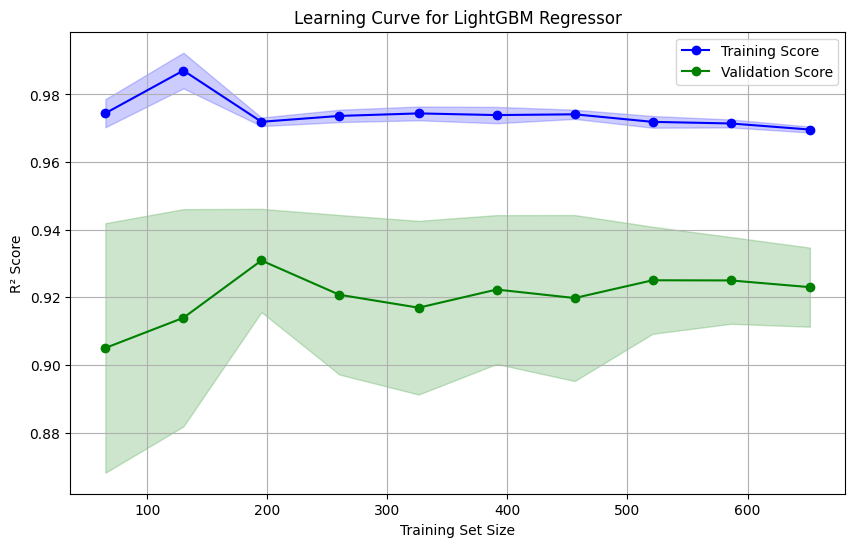

In [ ]:
# Initialize the LightGBM Regressor with adjusted parameters
lgb_model = LGBMRegressor(
    n_estimators=500,
    max_depth=3,
    num_leaves=10,
    learning_rate=0.05,
    reg_alpha=10.0,
    reg_lambda=10.0,
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=5,
    random_state=42
)

# Generate learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lgb_model,
    X=X,
    y=y,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and std of scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))

plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')

plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for LightGBM Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


###fixed

In [ ]:
lgb_model = LGBMRegressor(
    n_estimators=300,
    max_depth=2,
    num_leaves=5,
    learning_rate=0.05,
    reg_alpha=10.0,
    reg_lambda=10.0,
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=5,
    random_state=42
)


In [ ]:
reg_alpha=130.0
reg_lambda=130.0


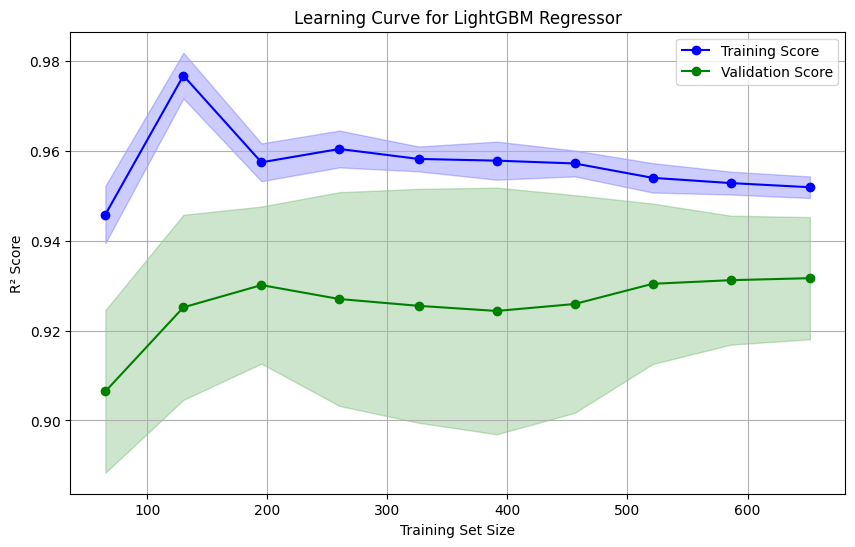

In [ ]:
# Initialize LightGBM Regressor with tuned hyperparameters
lgb_model = LGBMRegressor(
    n_estimators=300,
    max_depth=2,
    num_leaves=5,
    learning_rate=0.05,
    reg_alpha=130.0,
    reg_lambda=130.0,
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=3,
    random_state=42
)

# Generate learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lgb_model,
    X=X,
    y=y,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)  # Training set sizes from 10% to 100%
)

# Calculate mean and standard deviation for training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)


plt.figure(figsize=(10, 6))


plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')


plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')


plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for LightGBM Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [ ]:
for size, train_score, val_score in zip(train_sizes, train_scores_mean, test_scores_mean):
    print(f"Training Size: {size}, Training R²: {train_score:.4f}, Validation R²: {val_score:.4f}")


Training Size: 65, Training R²: 0.9459, Validation R²: 0.9065
Training Size: 130, Training R²: 0.9768, Validation R²: 0.9252
Training Size: 195, Training R²: 0.9575, Validation R²: 0.9301
Training Size: 260, Training R²: 0.9604, Validation R²: 0.9270
Training Size: 326, Training R²: 0.9582, Validation R²: 0.9255
Training Size: 391, Training R²: 0.9578, Validation R²: 0.9244
Training Size: 456, Training R²: 0.9572, Validation R²: 0.9259
Training Size: 521, Training R²: 0.9540, Validation R²: 0.9304
Training Size: 586, Training R²: 0.9529, Validation R²: 0.9312
Training Size: 652, Training R²: 0.9519, Validation R²: 0.9317


In [ ]:
lgb_model.fit(X_train, y_train)
y_pred = lgb_model.predict(X_test)

r2 = r2_score(y_test, y_pred)
print(f'Final R² Score: {r2:.4f}')

[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 455
[LightGBM] [Info] Number of data points in the train set: 521, number of used features: 3
[LightGBM] [Info]

#CatBoost Regressor

In [ ]:
pip install catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 4.8 MB/s eta 0:00:00


In [ ]:
# Initialize CatBoost Regressor
catboost_model = CatBoostRegressor(iterations=500, depth=8, learning_rate=0.1,
                                   loss_function='RMSE', verbose=50, random_state=42)

# Train the model
catboost_model.fit(X_train, y_train)


0:	learn: 290.5369996	total: 56.1ms	remaining: 28s
50:	learn: 56.0820319	total: 571ms	remaining: 5.03s
100:	learn: 43.7510273	total: 898ms	remaining: 3.55s
150:	learn: 32.9260032	total: 1.29s	remaining: 2.98s
200:	learn: 25.8656039	total: 1.64s	remaining: 2.43s
250:	learn: 21.0799502	total: 1.83s	remaining: 1.82s
300:	learn: 17.7289259	total: 2.26s	remaining: 1.5s
350:	learn: 14.6365932	total: 2.71s	remaining: 1.15s
400:	learn: 12.1794532	total: 3.19s	remaining: 787ms
450:	learn: 10.4450239	total: 3.72s	remaining: 404ms
499:	learn: 8.8650142	total: 4.19s	remaining: 0us


In [ ]:
# Predict on test data
y_pred = catboost_model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred) * 100  # R² in percentage
mse = mean_squared_error(y_test, y_pred)

print(f'CatBoost R² Score: {r2:.2f}%')
print(f'Mean Squared Error: {mse:.2f}')


CatBoost R² Score: 90.98%
Mean Squared Error: 6878.78


In [ ]:
# Perform 5-fold cross-validation
cv_scores = cross_val_score(catboost_model, X, y, cv=5, scoring='r2')

print(f'Cross-Validation R² Scores: {cv_scores}')
print(f'Mean CV R² Score: {cv_scores.mean() * 100:.2f}%')


0:	learn: 275.1022450	total: 6.52ms	remaining: 3.25s
50:	learn: 58.0655738	total: 349ms	remaining: 3.07s
100:	learn: 47.9430652	total: 571ms	remaining: 2.25s
150:	learn: 39.2743484	total: 766ms	remaining: 1.77s
200:	learn: 32.5636561	total: 905ms	remaining: 1.34s
250:	learn: 26.7487761	total: 1.04s	remaining: 1.03s
300:	learn: 21.8446196	total: 1.24s	remaining: 817ms
350:	learn: 17.9553190	total: 1.52s	remaining: 646ms
400:	learn: 16.0742293	total: 1.65s	remaining: 407ms
450:	learn: 13.4706228	total: 1.8s	remaining: 196ms
499:	learn: 11.6264110	total: 1.98s	remaining: 0us
0:	learn: 267.9784218	total: 7.7ms	remaining: 3.84s
50:	learn: 57.1874150	total: 269ms	remaining: 2.37s
100:	learn: 41.8531039	total: 406ms	remaining: 1.6s
150:	learn: 32.0454038	total: 542ms	remaining: 1.25s
200:	learn: 25.0593508	total: 693ms	remaining: 1.03s
250:	learn: 20.8856794	total: 827ms	remaining: 821ms
300:	learn: 17.7247727	total: 1.11s	remaining: 735ms
350:	learn: 15.1001133	total: 1.38s	remaining: 586ms


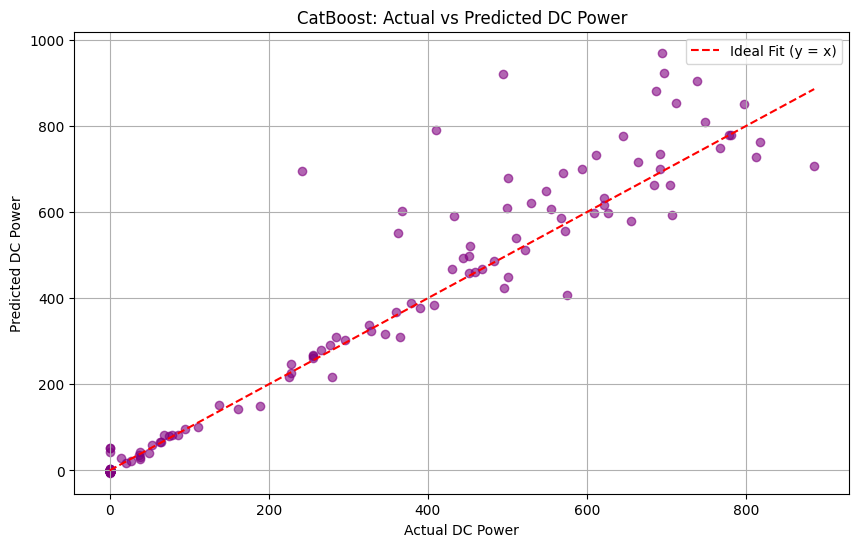

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='purple')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit (y = x)')
plt.xlabel('Actual DC Power')
plt.ylabel('Predicted DC Power')
plt.title('CatBoost: Actual vs Predicted DC Power')
plt.legend()
plt.grid(True)
plt.show()


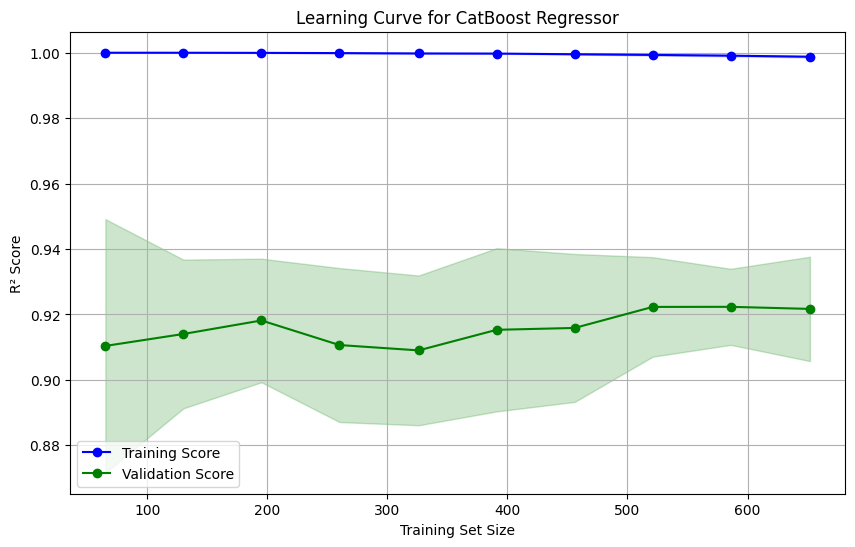

In [ ]:
# Create learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=CatBoostRegressor(iterations=500, depth=8, learning_rate=0.1,
                                loss_function='RMSE', random_state=42, verbose=0),
    X=X, y=y, cv=5, scoring='r2', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color='blue')

plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Validation Score')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for CatBoost Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()


#final LightGBM

In [ ]:
# Split data into train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Initialize LightGBM Regressor
lgb_model = LGBMRegressor(
    n_estimators=300,
    max_depth=3,
    num_leaves=10,
    learning_rate=0.05,
    reg_alpha=130.0,
    reg_lambda=130.0,
    random_state=42
)


In [ ]:
# Train the Model
lgb_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 652, number of used features: 3
[LightGBM] [Info] Start training from score 249.115540
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

LGBMRegressor(learning_rate=0.05, max_depth=3, n_estimators=300, num_leaves=10,
              random_state=42, reg_alpha=130.0, reg_lambda=130.0)

In [ ]:
y_pred = lgb_model.predict(X_test)

In [ ]:
# Evaluate the Model
r2 = r2_score(y_test, y_pred) * 100
mse = mean_squared_error(y_test, y_pred)

In [ ]:
print(f'R² Score: {r2:.2f}%')
print(f'Mean Squared Error: {mse:.2f}')

R² Score: 96.52%
Mean Squared Error: 3152.85


In [ ]:
# Generate Learning Curve Data
train_sizes, train_scores, test_scores = learning_curve(
    estimator=lgb_model, X=X, y=y, cv=5, scoring='r2', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

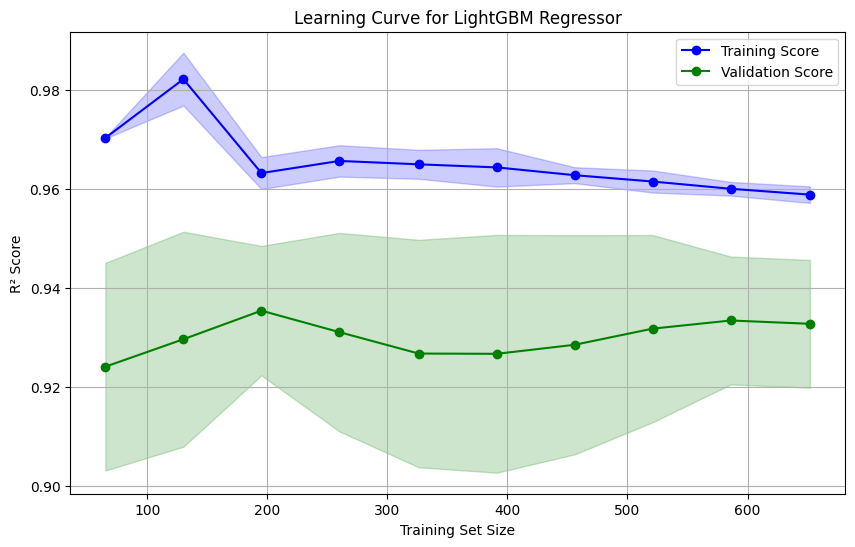

In [ ]:
# Plot the Learning Curve
plt.figure(figsize=(10, 6))

plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color='blue', label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color='green', label='Validation Score')

# Add Shaded Area for Standard Deviation
plt.fill_between(train_sizes,
                 np.mean(train_scores, axis=1) - np.std(train_scores, axis=1),
                 np.mean(train_scores, axis=1) + np.std(train_scores, axis=1),
                 alpha=0.2, color='blue')
plt.fill_between(train_sizes,
                 np.mean(test_scores, axis=1) - np.std(test_scores, axis=1),
                 np.mean(test_scores, axis=1) + np.std(test_scores, axis=1),
                 alpha=0.2, color='green')

plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.title('Learning Curve for LightGBM Regressor')
plt.legend(loc='best')
plt.grid(True)
plt.show()

# LSTM Model for Generation Power

In [ ]:
df2 = solar.copy()

In [ ]:
df2.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING,date
0,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2020-05-15
1,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2020-05-15
2,2020-05-15,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2020-05-15
3,2020-05-15,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2020-05-15
4,2020-05-15,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2020-05-15


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   DATE_TIME            67698 non-null  datetime64[ns]
 1   SOURCE_KEY           67698 non-null  object        
 2   DC_POWER             67698 non-null  float64       
 3   AC_POWER             67698 non-null  float64       
 4   DAILY_YIELD          67698 non-null  float64       
 5   TOTAL_YIELD          67698 non-null  float64       
 6   AMBIENT_TEMPERATURE  67698 non-null  float64       
 7   MODULE_TEMPERATURE   67698 non-null  float64       
 8   IRRADIATION          67698 non-null  float64       
 9   DATE                 67698 non-null  object        
 10  TIME                 67698 non-null  object        
 11  DAY                  67698 non-null  int32         
 12  MONTH                67698 non-null  int32         
 13  WEEK                 67698 non-

In [ ]:
X= df2[['AMBIENT_TEMPERATURE','MODULE_TEMPERATURE','IRRADIATION']]
y= df2['DC_POWER']

In [ ]:
df2=df2.resample("H")["AMBIENT_TEMPERATURE","MODULE_TEMPERATURE","IRRADIATION","DC_POWER"].mean()
df2.head()

,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DC_POWER
DATE_TIME,,,,
2020-05-15 00:00:00,26.767055,24.582656,0.0,0.0
2020-05-15 01:00:00,26.505909,25.172109,0.0,0.0
2020-05-15 02:00:00,26.296562,24.555514,0.0,0.0
2020-05-15 03:00:00,26.141691,24.627655,0.0,0.0
2020-05-15 04:00:00,25.509473,24.658230,0.0,0.0


In [ ]:
def df_to_X_y(df, target_column, window_size=6):

    df_as_np = df.drop(columns=[target_column]).to_numpy()  # Features as numpy array
    target_as_np = df[target_column].to_numpy()  # Target (y) as numpy array

    X = []
    y = []

    for i in range(len(df_as_np) - window_size):
        X.append(df_as_np[i:i + window_size])  # Sliding window for X features
        y.append(target_as_np[i + window_size])  # Corresponding target

    return np.array(X), np.array(y)

# Apply the function to your data
X, y = df_to_X_y(df2, target_column='DC_POWER', window_size=6)

# Check shapes
X.shape, y.shape


((810, 6, 3), (810,))

In [ ]:
# making a train and test dataset to train the model, This is an 80-10-10 split
X_train, y_train  = X[:648], y[:648]
X_val, y_val  = X[648:729], y[648:729]
X_test, y_test  = X[729:], y[729:]

In [ ]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(648, 6, 3) (648,)
(81, 6, 3) (81,)
(81, 6, 3) (81,)


In [ ]:
# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Reshape the 3D arrays to 2D (if applicable)
n_samples, n_timesteps, n_features = X_train.shape
X_train_reshaped = X_train.reshape(-1, n_features)
X_val_reshaped = X_val.reshape(-1, n_features)
X_test_reshaped = X_test.reshape(-1, n_features)

# Scale the reshaped data
X_train_scaled_reshaped = scaler.fit_transform(X_train_reshaped)
X_val_scaled_reshaped = scaler.transform(X_val_reshaped)
X_test_scaled_reshaped = scaler.transform(X_test_reshaped)

# Reshape back to 3D
X_train_scaled = X_train_scaled_reshaped.reshape(n_samples, n_timesteps, n_features)
X_val_scaled = X_val_scaled_reshaped.reshape(X_val.shape)
X_test_scaled = X_test_scaled_reshaped.reshape(X_test.shape)


In [ ]:
# Defining the model and adding layers into the LSTM model
model1 = Sequential()
# Assuming input shape of (6, 3) for 60 minutes of daily yield data
model1.add(InputLayer(input_shape=(6, 3)))  # 5 time steps, 1 feature

# LSTM layer with 32 units, reduced from 64 to prevent overfitting
model1.add(LSTM(32))

# Adding a Dense layer with 8 units and ReLU activation
model1.add(Dense(8, activation='relu'))

# Adding Dropout for regularization (optional, 0.2 means 20% dropout rate)
model1.add(Dropout(0.2))
# Output layer for a single value prediction with linear activation
model1.add(Dense(1, activation='linear'))

# Compile the model
model1.compile(optimizer='adam', loss='mse')

# Model summary to check the architecture
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 32)                  │           4,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 8)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,881 (19.07 KB)

 Trainable params: 4,881 (19.07 KB)

 Non-trainable params: 0 (0.00 B)

## Evaluate model

In [329]:
# Add early stopping to stop training if the model stops improving
es = EarlyStopping(
    monitor='val_mae',  # Stop if RMSE doesn't improve
    patience=50,  # Wait 10 epochs before stopping
    restore_best_weights=True,  # Restore the best weights after stopping
    verbose=1
)

model1.compile(
      optimizer=Adam(learning_rate=1e-3),
      loss='mean_squared_error',
       metrics=["mae"]

)

In [330]:
# Fit the model with better structure, additional callbacks, and dynamic batch size
history1=model1.fit(
    X_train_scaled,
    y_train,
    validation_data=(X_val_scaled, y_val),  # Provide validation data for real-time evaluation
    epochs=75,  # Increase epochs for a more robust model, can be adjusted later
    batch_size=32,  # Use a moderate batch size (adjust based on your hardware)
    callbacks=[es],  # Include EarlyStopping for better convergence
    verbose=1  # Show training progress
)

Epoch 1/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 177026.9375 - mae: 270.0519 - val_loss: 111731.5781 - val_mae: 225.9225
Epoch 2/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 163405.0312 - mae: 251.3618 - val_loss: 111699.1875 - val_mae: 225.9031
Epoch 3/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 170361.1094 - mae: 259.4621 - val_loss: 111622.1328 - val_mae: 225.8579
Epoch 4/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 191758.7188 - mae: 288.8109 - val_loss: 111338.4531 - val_mae: 225.7181
Epoch 5/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 162958.8594 - mae: 251.2617 - val_loss: 110759.6562 - val_mae: 225.5089
Epoch 6/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 173801.5625 - mae: 269.7462 - val_loss: 110229.9531 - val_mae: 225.3019
Epoch 7/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 157660.1406 - mae: 248.5578 - val_loss: 109794.9609 - val_mae: 225.1223
Epoch 8/75
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 156658.7500 - mae: 246.0

In [331]:
# Make predictions on the training data
train_predictions = model1.predict(X_train_scaled).flatten()

# Create a DataFrame to compare predictions and actual values
train_results = pd.DataFrame({
    'Train Predictions': train_predictions,
    'Actual Values': y_train.flatten()  # Ensure y_train is also flattened for consistency
})

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


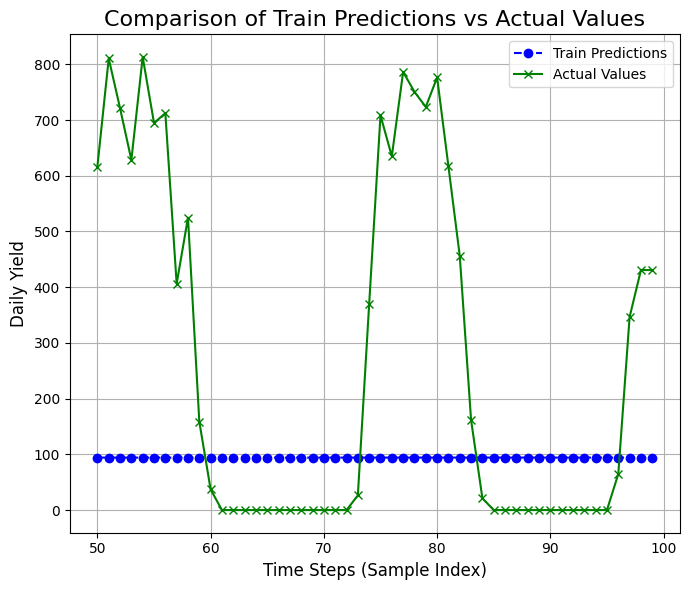

In [332]:
# Set plot size for better visibility
plt.figure(figsize=(7, 6))

# Plot Train Predictions and Actual Values
plt.plot(train_results['Train Predictions'][50:100], label='Train Predictions', color='blue', linestyle='--', marker='o')
plt.plot(train_results['Actual Values'][50:100], label='Actual Values', color='green', linestyle='-', marker='x')

# Add labels, title, and grid
plt.title('Comparison of Train Predictions vs Actual Values', fontsize=16)
plt.xlabel('Time Steps (Sample Index)', fontsize=12)
plt.ylabel('Daily Yield', fontsize=12)
plt.grid(True)

# Add a legend to differentiate the lines
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [333]:
# Make predictions on the validation data
val_predictions = model1.predict(X_val).flatten()

# Create a DataFrame to compare predictions and actual values
val_results = pd.DataFrame({
    'Val Predictions': val_predictions,
    'Actual Values': y_val.flatten()  # Ensure y_val is flattened for consistency
})

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


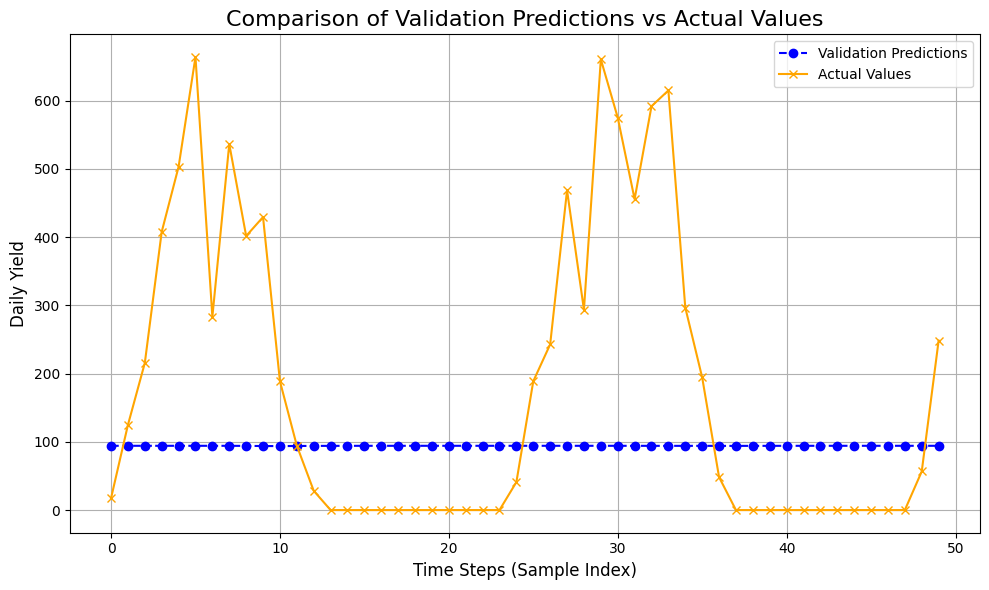

In [334]:
# Set plot size for better visibility
plt.figure(figsize=(10, 6))

# Plot Validation Predictions and Actual Values
plt.plot(val_results['Val Predictions'][:50], label='Validation Predictions', color='blue', linestyle='--', marker='o')
plt.plot(val_results['Actual Values'][:50], label='Actual Values', color='orange', linestyle='-', marker='x')

# Add labels, title, and grid
plt.title('Comparison of Validation Predictions vs Actual Values', fontsize=16)
plt.xlabel('Time Steps (Sample Index)', fontsize=12)
plt.ylabel('Daily Yield', fontsize=12)
plt.grid(True)

# Add a legend to differentiate the lines
plt.legend()
# Show the plot
plt.tight_layout()
plt.show()

In [335]:
# Make predictions on the test data
test_predictions_1 = model1.predict(X_test_scaled).flatten()

# Create a DataFrame to compare predictions and actual values
test_results_1 = pd.DataFrame({
    'Test Predictions': test_predictions_1,
    'Actual Values': y_test.flatten()  # Ensure y_test is flattened for consistency
})

# Display the first few rows of the DataFrame
test_results_1.head()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  


,Test Predictions,Actual Values
0,94.202225,563.974161
1,94.203537,378.734600
2,94.204193,201.544654
3,94.204239,46.031071
4,94.204208,0.000000


In [336]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd

def evaluate_model_performance(y_true, y_pred):
    """
    Evaluates model performance by computing key metrics and generating visualizations.

    Parameters:
    y_true (array-like): Actual values
    y_pred (array-like): Predicted values

    Returns:
    dict: A dictionary containing calculated metrics (MSE, RMSE, MAE, R²)
    """

    # Flattening inputs if they are not 1D
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()

    # Calculating key metrics
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    # Printing metrics
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"R² Score: {r2:.4f}")

    # Residuals calculation
    residuals = y_true - y_pred

    # Plotting residuals distribution
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.hist(residuals, bins=20, edgecolor='black')
    plt.title('Residuals Distribution')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')

    # Plotting Predictions vs Actual Values
    plt.subplot(1, 2, 2)
    plt.scatter(y_true, y_pred, alpha=0.6)
    plt.title('Predictions vs Actual Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], color='red', linestyle='--')  # Ideal line
    plt.tight_layout()
    plt.show()

    # Plotting actual vs predicted over time (for time series or sequential data)
    plt.figure(figsize=(10, 6))
    plt.plot(y_true, label='Actual Values')
    plt.plot(y_pred, label='Predicted Values', alpha=0.7)
    plt.title('Actual vs Predicted Values Over Time')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

    # Returning a dictionary of computed metrics
    metrics = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'R²': r2
    }

    return metrics


Mean Squared Error (MSE): 68410.8227
Root Mean Squared Error (RMSE): 261.5546
Mean Absolute Error (MAE): 196.3812
R² Score: -0.1671


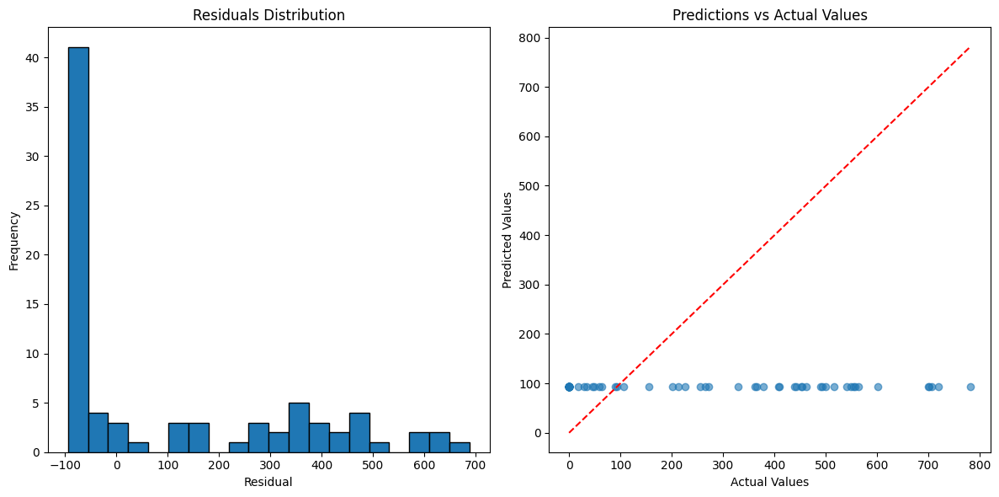

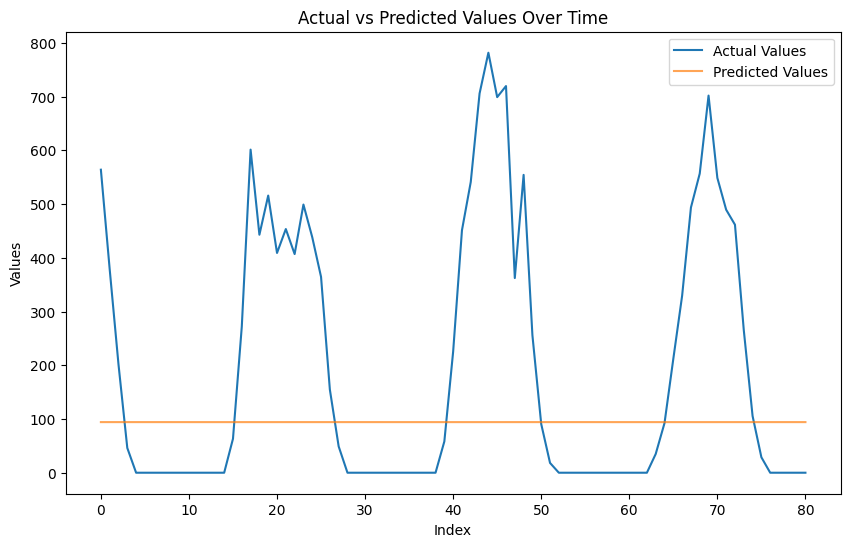

In [337]:
train_metrics_model1 = evaluate_model_performance(y_test, test_predictions_1)

In [338]:
from sklearn.metrics import mean_absolute_error, r2_score

# Step 1: Define the model with optimized hyperparameters
model2 = Sequential()

# Input layer - same window size of (6, 3)
model2.add(LSTM(64, input_shape=(6, 3)))  # Increased LSTM units to 64
model2.add(Dense(16, activation='relu'))
model2.add(Dropout(0.3))

# Output layer with 1 unit for prediction
model2.add(Dense(1, activation='linear'))

# Step 2: Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)  # Reduced learning rate for better convergence
model2.compile(optimizer=optimizer, loss='mae',metrics=["mae"])

# Step 3: Define EarlyStopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_mae', patience=10, restore_best_weights=True)

# Step 4: Train the model with an increased number of epochs and modified batch size
history = model2.fit(X_train_scaled, y_train,
                    validation_data=(X_val_scaled, y_val),
                    epochs=50,  # Increased epochs for better learning
                    batch_size=64,  # Increased batch size
                    callbacks=[early_stopping],
                    verbose=1)

Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 269.3611 - mae: 269.3611 - val_loss: 225.9015 - val_mae: 225.9015
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 265.4124 - mae: 265.4124 - val_loss: 225.8719 - val_mae: 225.8719
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 252.3293 - mae: 252.3293 - val_loss: 225.8194 - val_mae: 225.8194
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 259.9740 - mae: 259.9740 - val_loss: 225.6773 - val_mae: 225.6773
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 239.3158 - mae: 239.3158 - val_loss: 225.4037 - val_mae: 225.4037
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 256.2265 - mae: 256.2265 - val_loss: 225.0118 - val_mae: 225.0118
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 249.2313 - mae: 249.2313 - val_loss: 224.6594 - val_mae: 224.6594
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 255.6884 - mae: 255.6884 - val_loss: 223.8594 - val_mae: 223.8594
Epoch 9

In [339]:
test_predictions_2 = model2.predict(X_test_scaled).flatten()

# Create a DataFrame to compare predictions and actual values
test_results_2 = pd.DataFrame({
    'Test Predictions': test_predictions_2,
    'Actual Values': y_test.flatten()  # Ensure y_test is flattened for consistency
})

# Display the first few rows of the DataFrame
test_results_2.head()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


,Test Predictions,Actual Values
0,246.717575,563.974161
1,242.117935,378.734600
2,202.542786,201.544654
3,72.684868,46.031071
4,0.087129,0.000000


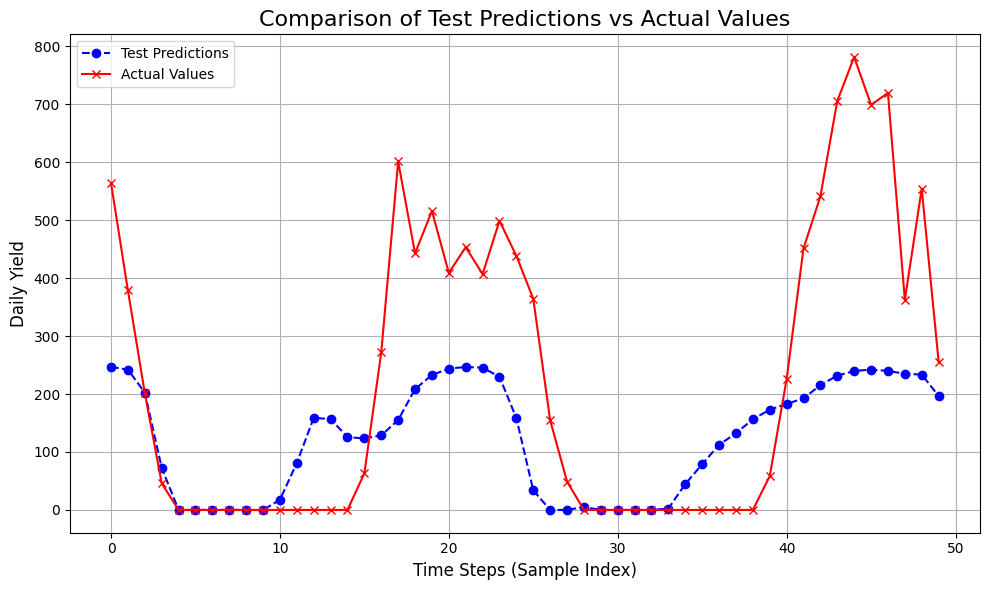

In [340]:
plt.figure(figsize=(10, 6))

# Plot Test Predictions and Actual Values
plt.plot(test_results_2['Test Predictions'][:50], label='Test Predictions', color='blue', linestyle='--', marker='o')
plt.plot(test_results_2['Actual Values'][:50], label='Actual Values', color='red', linestyle='-', marker='x')

# Add labels, title, and grid
plt.title('Comparison of Test Predictions vs Actual Values', fontsize=16)
plt.xlabel('Time Steps (Sample Index)', fontsize=12)
plt.ylabel('Daily Yield', fontsize=12)
plt.grid(True)

# Add a legend to differentiate the lines
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

Mean Squared Error (MSE): 36808.3935
Root Mean Squared Error (RMSE): 191.8551
Mean Absolute Error (MAE): 130.0527
R² Score: 0.3721


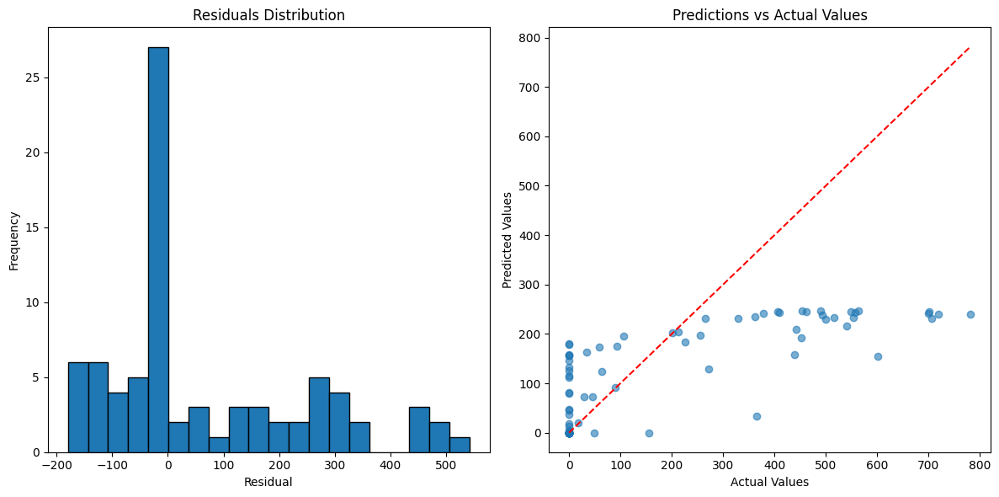

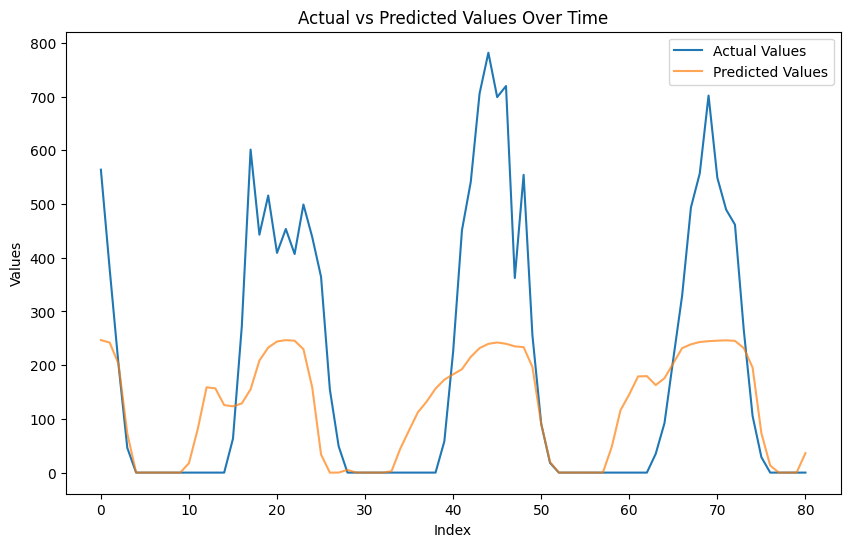

In [341]:
train_metrics_model2 = evaluate_model_performance(y_test, test_predictions_2)

## Evaluate2


In [342]:
from sklearn.metrics import mean_absolute_error, r2_score

# Step 1: Define the model with optimized hyperparameters
model2 = Sequential()

# Input layer - same window size of (6, 3)
model2.add(LSTM(70, input_shape=(6, 3)))  # Increased LSTM units to 64
model2.add(Dense(16, activation='relu'))
model2.add(Dropout(0.3))

# Output layer with 1 unit for prediction
model2.add(Dense(1, activation='linear'))

# Step 2: Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.001)  # Reduced learning rate for better convergence
model2.compile(optimizer=optimizer, loss='mae',metrics=["mae"])

# Step 3: Define EarlyStopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_mae', patience=10, restore_best_weights=True)

# Step 4: Train the model with an increased number of epochs and modified batch size
history = model2.fit(X_train_scaled, y_train,
                    validation_data=(X_val_scaled, y_val),
                    epochs=100,  # Increased epochs for better learning
                    batch_size=64,  # Increased batch size
                    callbacks=[early_stopping],
                    verbose=1)

Epoch 1/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 265.7187 - mae: 265.7187 - val_loss: 225.8707 - val_mae: 225.8707
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 262.2450 - mae: 262.2450 - val_loss: 225.8053 - val_mae: 225.8053
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 243.4979 - mae: 243.4979 - val_loss: 225.6646 - val_mae: 225.6646
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 257.9892 - mae: 257.9892 - val_loss: 225.3167 - val_mae: 225.3167
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 253.4348 - mae: 253.4348 - val_loss: 224.7290 - val_mae: 224.7290
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 254.7052 - mae: 254.7052 - val_loss: 223.9136 - val_mae: 223.9136
Epoch 7/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 250.8753 - mae: 250.8753 - val_loss: 222.5871 - val_mae: 222.5871
Epoch 8/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 256.8708 - mae: 256.8708 - val_loss: 221.1353 - val_mae: 221.135

In [343]:
test_predictions_2 = model2.predict(X_test_scaled).flatten()

# Create a DataFrame to compare predictions and actual values
test_results_2 = pd.DataFrame({
    'Test Predictions': test_predictions_2,
    'Actual Values': y_test.flatten()  # Ensure y_test is flattened for consistency
})

# Display the first few rows of the DataFrame
test_results_2.head()

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


,Test Predictions,Actual Values
0,540.229980,563.974161
1,373.565277,378.734600
2,115.816635,201.544654
3,1.667968,46.031071
4,0.083018,0.000000


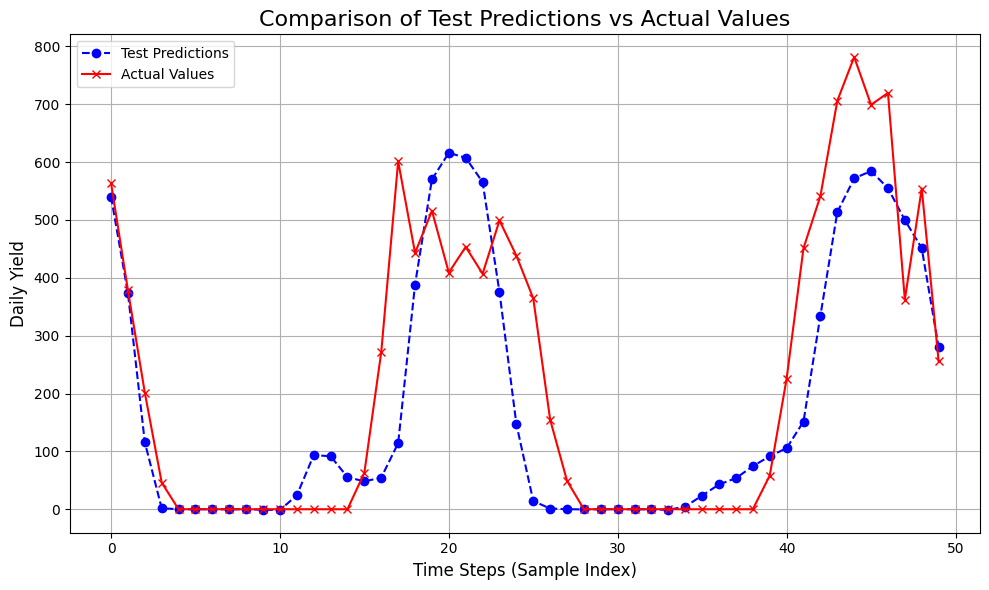

In [344]:
plt.figure(figsize=(10, 6))

# Plot Test Predictions and Actual Values
plt.plot(test_results_2['Test Predictions'][:50], label='Test Predictions', color='blue', linestyle='--', marker='o')
plt.plot(test_results_2['Actual Values'][:50], label='Actual Values', color='red', linestyle='-', marker='x')

# Add labels, title, and grid
plt.title('Comparison of Test Predictions vs Actual Values', fontsize=16)
plt.xlabel('Time Steps (Sample Index)', fontsize=12)
plt.ylabel('Daily Yield', fontsize=12)
plt.grid(True)

# Add a legend to differentiate the lines
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

Mean Squared Error (MSE): 13501.2619
Root Mean Squared Error (RMSE): 116.1949
Mean Absolute Error (MAE): 72.0616
R² Score: 0.7697


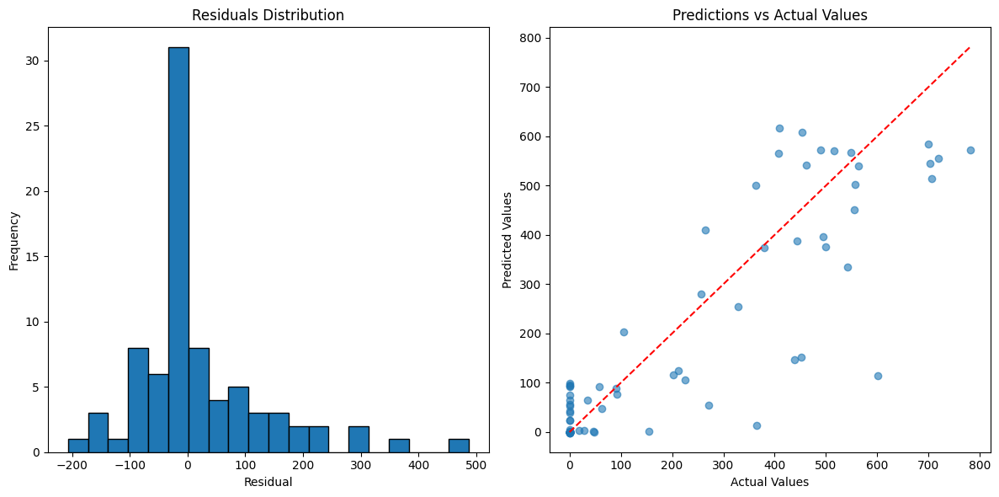

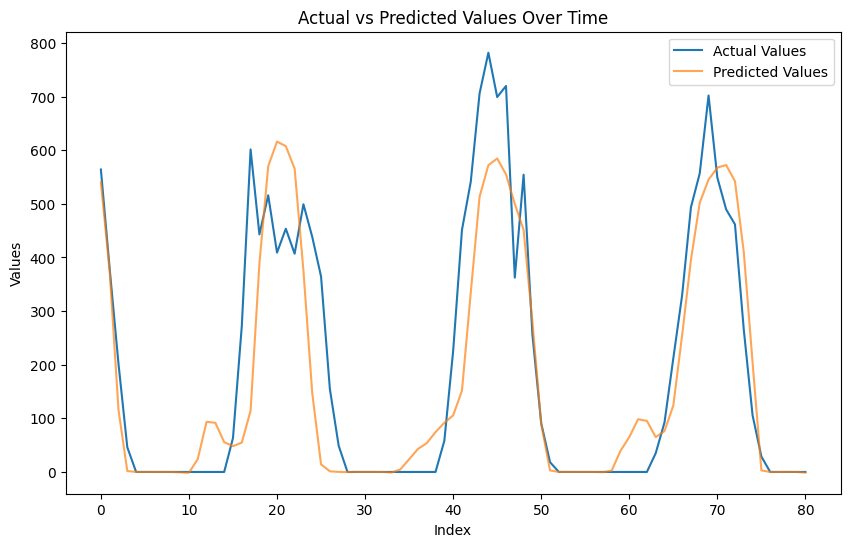

In [345]:
train_metrics_model2 = evaluate_model_performance(y_test, test_predictions_2)

In [346]:
from sklearn.metrics import mean_absolute_error, r2_score

# Step 1: Define the model with optimized hyperparameters
model2 = Sequential()

# Input layer - same window size of (6, 3)
model2.add(LSTM(75, input_shape=(6, 3)))  # Increased LSTM units to 64
model2.add(Dense(16, activation='relu'))
model2.add(Dropout(0.3)) #it was 0.3

# Output layer with 1 unit for prediction
model2.add(Dense(1, activation='linear'))

# Step 2: Compile the model with Adam optimizer and a lower learning rate
optimizer = Adam(learning_rate=0.0009)  # Reduced learning rate to 0.0005 (it was 0.001)
model2.compile(optimizer=optimizer, loss='mae',metrics=["mae"])

# Step 3: Define EarlyStopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_mae', patience=10, restore_best_weights=True)

# Step 4: Train the model with an increased number of epochs and modified batch size
history = model2.fit(X_train_scaled, y_train,
                    validation_data=(X_val_scaled, y_val),
                    epochs=100,  # Increased epochs for better learning
                    batch_size=32,  # Increased batch size
                    callbacks=[early_stopping],
                    verbose=1)

Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 274.4943 - mae: 274.4943 - val_loss: 225.8092 - val_mae: 225.8092
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 262.7832 - mae: 262.7832 - val_loss: 225.4032 - val_mae: 225.4032
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 279.6354 - mae: 279.6354 - val_loss: 224.5082 - val_mae: 224.5082
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 257.8735 - mae: 257.8735 - val_loss: 222.9233 - val_mae: 222.9233
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 257.2986 - mae: 257.2986 - val_loss: 219.2134 - val_mae: 219.2134
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 244.2529 - mae: 244.2529 - val_loss: 214.7063 - val_mae: 214.7063
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 256.7789 - mae: 256.7789 - val_loss: 212.8432 - val_mae: 212.8432
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 256.8760 - mae: 256.8760 - val_loss: 210.1539 - val_mae: 210.1

In [347]:
test_predictions_2 = model2.predict(X_test_scaled).flatten()

# Create a DataFrame to compare predictions and actual values
test_results_2 = pd.DataFrame({
    'Test Predictions': test_predictions_2,
    'Actual Values': y_test.flatten()  # Ensure y_test is flattened for consistency
})

# Display the first few rows of the DataFrame
test_results_2.head()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


,Test Predictions,Actual Values
0,579.655884,563.974161
1,398.682404,378.734600
2,144.756744,201.544654
3,1.361277,46.031071
4,0.130378,0.000000


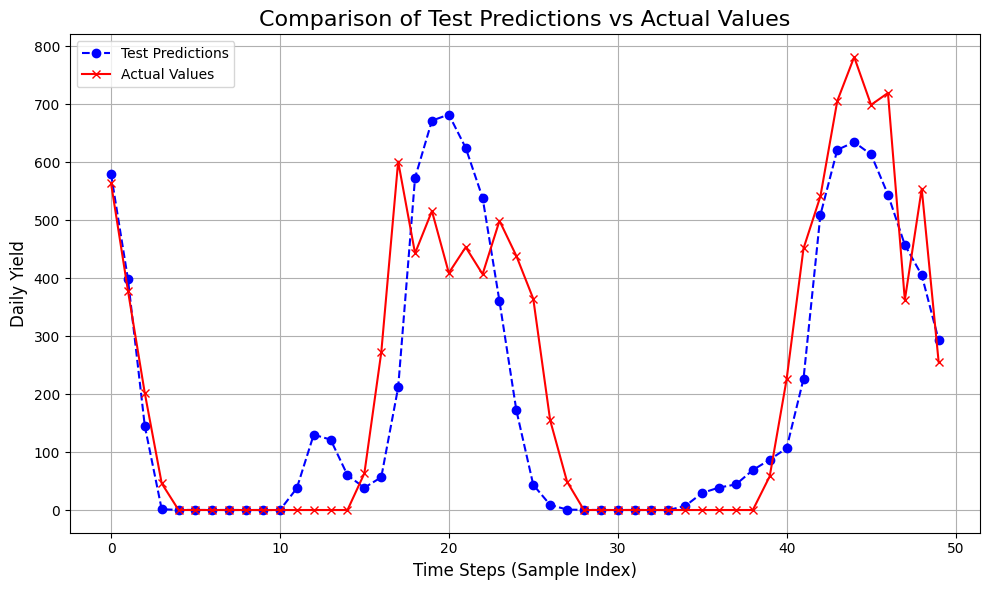

In [348]:
plt.figure(figsize=(10, 6))

# Plot Test Predictions and Actual Values
plt.plot(test_results_2['Test Predictions'][:50], label='Test Predictions', color='blue', linestyle='--', marker='o')
plt.plot(test_results_2['Actual Values'][:50], label='Actual Values', color='red', linestyle='-', marker='x')

# Add labels, title, and grid
plt.title('Comparison of Test Predictions vs Actual Values', fontsize=16)
plt.xlabel('Time Steps (Sample Index)', fontsize=12)
plt.ylabel('Daily Yield', fontsize=12)
plt.grid(True)

# Add a legend to differentiate the lines
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

Mean Squared Error (MSE): 10589.1147
Root Mean Squared Error (RMSE): 102.9034
Mean Absolute Error (MAE): 63.0896
R² Score: 0.8194


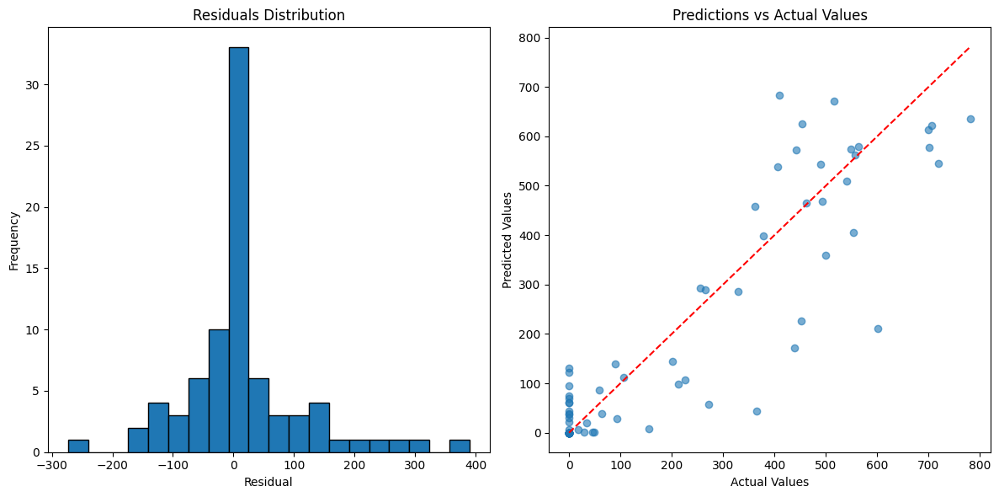

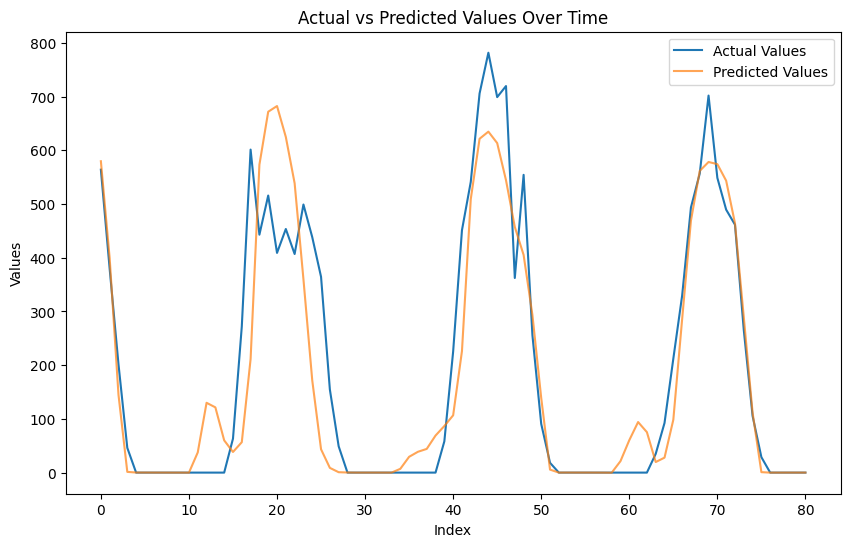

In [349]:
train_metrics_model2 = evaluate_model_performance(y_test, test_predictions_2)

In [350]:
import matplotlib.pyplot as plt

def plot_history(history):
    """
    Plots the model's MAE for both the training and validation sets.
    This will help assess the model's performance and whether it is underfitting or overfitting.
    """
    # Extract values from history
    mae = history.history['mae']
    val_mae = history.history['val_mae']

    epochs = range(1, len(mae) + 1)

    # Plotting MAE
    plt.figure(figsize=(10, 6))

    # MAE plot
    plt.plot(epochs, mae, label='Training MAE')
    plt.plot(epochs, val_mae, label='Validation MAE')
    plt.title('Training and Validation MAE')
    plt.xlabel('Epochs')
    plt.ylabel('Mean Absolute Error (MAE)')
    plt.legend()
    plt.grid(True)

    plt.show()


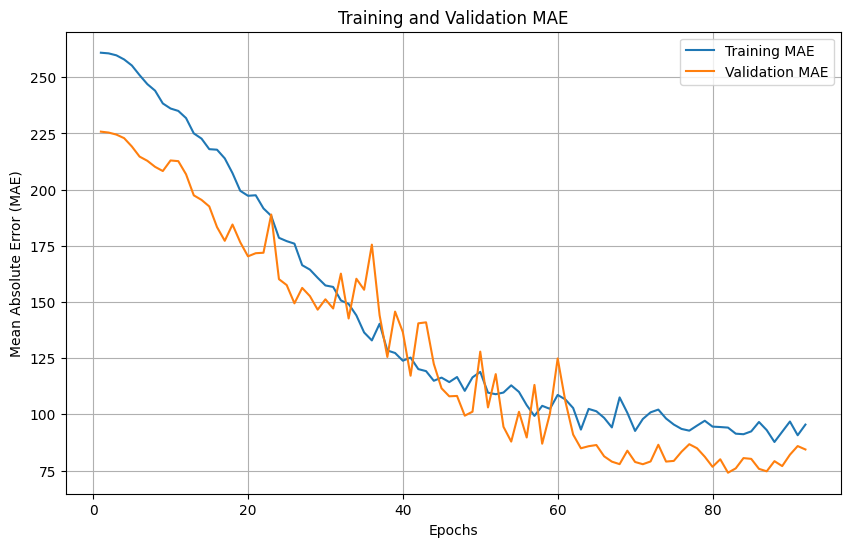

In [351]:
plot_history(history)